In [1]:
pwd

'/Users/ud4/repos/GitHub/FATESFACE'

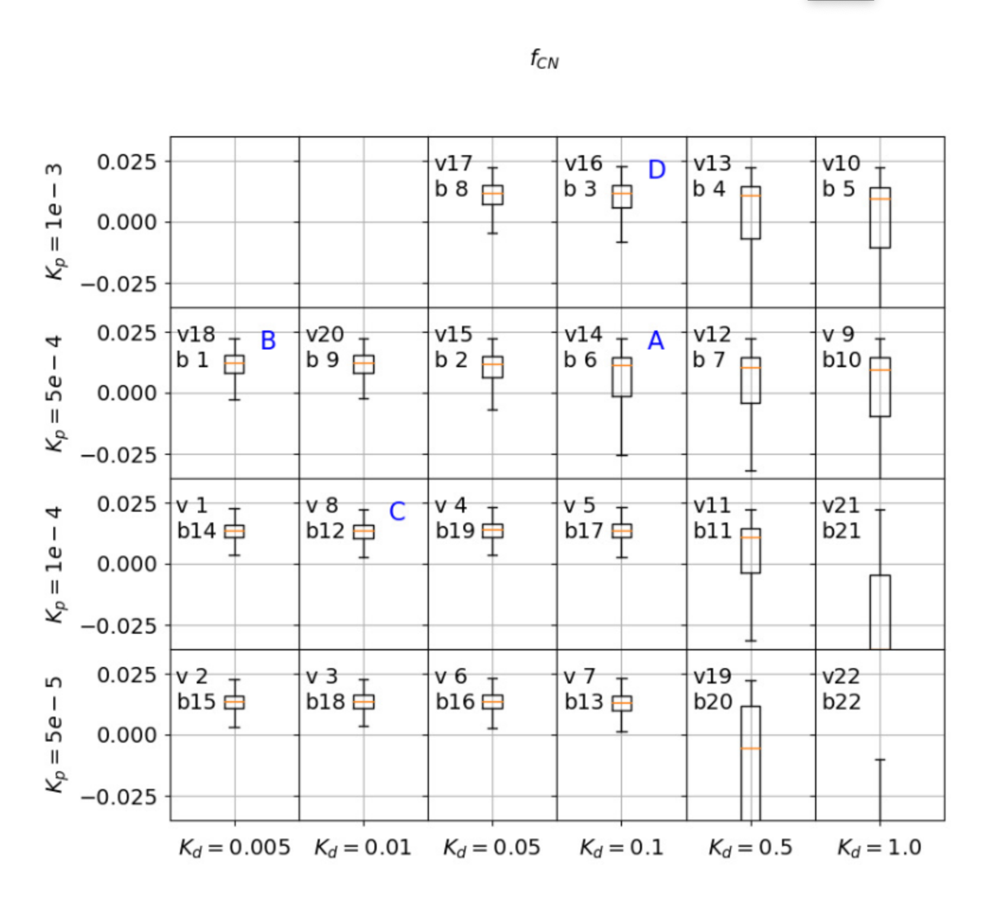

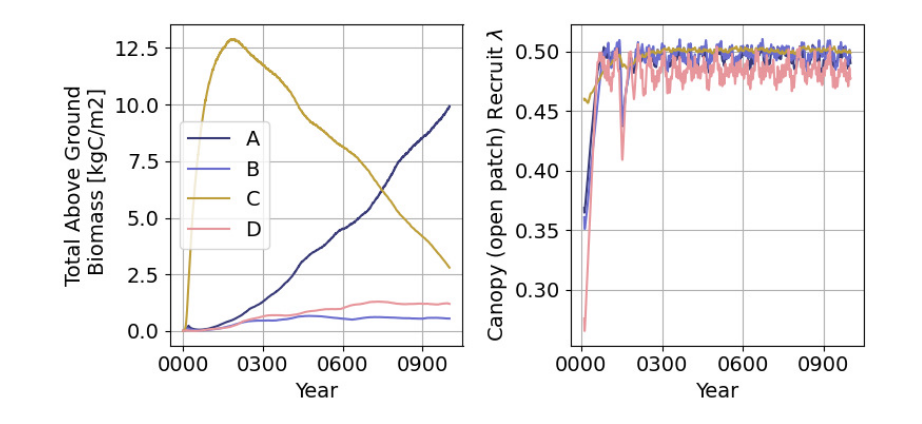

Source : Knox 2023 (under review; https://d197for5662m48.cloudfront.net/documents/publicationstatus/129549/preprint_pdf/4892791c8be5504aff47afd6065937b7.pdf)


In [2]:
from IPython.display import Image, display
display(Image(filename='/Users/ud4/Downloads/PIDs.png',width=800))
display(Image(filename='/Users/ud4/Downloads/BiomassVsPIDs.png',width=800))
print ("Source : Knox 2023 (under review; https://d197for5662m48.cloudfront.net/documents/publicationstatus/129549/preprint_pdf/4892791c8be5504aff47afd6065937b7.pdf)")

# ALL PID cases

PID | Kp | Kd
---|---|---
A|0.0005|0.1
B|0.0005|0.005
C|0.0001|0.01
D|0.001|0.1
E|0.001|0.5
F|0.005|0.1
G|0.005|0.5
H|0.001|1.0

## Index

Figure Set 1: FATES_NPP (for C-only at that site and RD/ECA)  <br>
Figure Set 2: FATES_NPP <br>
Figure Set 3: FATES_STOREC <br>
Figure Set 3: FATES_STOREC_TF <br>
Figure Set 4: FATES_STOREN <br>
Figure Set 4: FATES_STOREN_TF <br>
Figure Set 5: FATES_STOREC_TF / FATES_STOREN_TF <br>
Figure Set 3: FATES_L2FR <br>
Figure Set 6: FATES_FROOTC_ALLOC / FATES_LEAFC_ALLOC <br>
Figure Set 7: FATES_FROOTC / FATES_LEAFC <br>
Figure Set 7: FATES_FROOTC <br>
Figure Set 7: FATES_LEAFC <br>
Figure Set 8: FATES_NO3UPTAKE <br>
Figure Set 8: FATES_NH4UPTAKE  <br>
Figure Set 9: NET_NMIN <br>
Figure Set 9: GROSS_NMIN <br>
Figure Set10: SMIN_NO3_LEACHED <br>
Figure Set10: DENIT <br>


## Features of this Jupyter Notebook
- for a cell, you can choose which variables you are interested in for a single simulation.
- some plots from postprocessor

In [3]:
import os,glob
import xarray as xr
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import pyreadr # to read .rds files
import datetime as dt

np.set_printoptions(suppress=True)

# Define FilePaths

In [4]:
path_in = "/Users/ud4/FATESMDS_analysis/outputs/runs/tests_alp/230309/"


In [5]:
# RD only

fnames={}
fnames["DUK_PIDA_Conly_AgBgW"] = f"{path_in}Bharat_AW_Nalloc_api25e3sm_mf0df100_r0615_Base_PIDA_AgBgW_processed/Bharat_AW_Nalloc_api25e3sm_mf0df100_r0615_Base_PIDA_AgBgW_US-DUK_trans.nc"
fnames["ORN_PIDA_Conly_AgBgW"] = f"{path_in}Bharat_AW_Nalloc_api25e3sm_mf0df100_r0615_Base_PIDA_AgBgW_processed/Bharat_AW_Nalloc_api25e3sm_mf0df100_r0615_Base_PIDA_AgBgW_US-ORN_trans.nc"

fnames["DUK_PIDB_Conly"] = f"{path_in}Bharat_AW_Nalloc_api25e3sm_mf0df100_r0614_Base_PIDB_AgBgW_processed/Bharat_AW_Nalloc_api25e3sm_mf0df100_r0614_Base_PIDB_AgBgW_US-DUK_trans.nc"
fnames["ORN_PIDB_Conly"] = f"{path_in}Bharat_AW_Nalloc_api25e3sm_mf0df100_r0614_Base_PIDB_AgBgW_processed/Bharat_AW_Nalloc_api25e3sm_mf0df100_r0614_Base_PIDB_AgBgW_US-ORN_trans.nc"

fnames["DUK_PIDC_Conly"] = f"{path_in}Bharat_AW_Nalloc_api25e3sm_mf0df100_r0614_Base_PIDC_AgBgW_processed/Bharat_AW_Nalloc_api25e3sm_mf0df100_r0614_Base_PIDC_AgBgW_US-DUK_trans.nc"
fnames["ORN_PIDC_Conly"] = f"{path_in}Bharat_AW_Nalloc_api25e3sm_mf0df100_r0614_Base_PIDC_AgBgW_processed/Bharat_AW_Nalloc_api25e3sm_mf0df100_r0614_Base_PIDC_AgBgW_US-ORN_trans.nc"

fnames["DUK_PIDD_Conly"] = f"{path_in}Bharat_AW_Nalloc_api25e3sm_mf0df100_r0614_Base_PIDD_AgBgW_processed/Bharat_AW_Nalloc_api25e3sm_mf0df100_r0614_Base_PIDD_AgBgW_US-DUK_trans.nc"
fnames["ORN_PIDD_Conly"] = f"{path_in}Bharat_AW_Nalloc_api25e3sm_mf0df100_r0614_Base_PIDD_AgBgW_processed/Bharat_AW_Nalloc_api25e3sm_mf0df100_r0614_Base_PIDD_AgBgW_US-ORN_trans.nc"

fnames["DUK_PIDA_RD_AgBgW"] = f"{path_in}Bharat_AW_Nalloc_api25e3sm_mf0df100_r0615_Base_PIDA_AgBgW_RD_processed/Bharat_AW_Nalloc_api25e3sm_mf0df100_r0615_Base_PIDA_AgBgW_RD_US-DUK_trans.nc"
fnames["ORN_PIDA_RD_AgBgW"] = f"{path_in}Bharat_AW_Nalloc_api25e3sm_mf0df100_r0615_Base_PIDA_AgBgW_RD_processed/Bharat_AW_Nalloc_api25e3sm_mf0df100_r0615_Base_PIDA_AgBgW_RD_US-ORN_trans.nc"

fnames["DUK_PIDB_RD_AgBgW"] = f"{path_in}Bharat_AW_Nalloc_api25e3sm_mf0df100_r0614_Base_PIDB_AgBgW_RD_processed/Bharat_AW_Nalloc_api25e3sm_mf0df100_r0614_Base_PIDB_AgBgW_RD_US-DUK_trans.nc"
fnames["ORN_PIDB_RD_AgBgW"] = f"{path_in}Bharat_AW_Nalloc_api25e3sm_mf0df100_r0614_Base_PIDB_AgBgW_RD_processed/Bharat_AW_Nalloc_api25e3sm_mf0df100_r0614_Base_PIDB_AgBgW_RD_US-ORN_trans.nc"

#"ORN_PIDC_RD" : Simulation missing *Running
fnames["DUK_PIDC_Conly_AgBgW"] = f"{path_in}Bharat_AW_Nalloc_api25e3sm_mf0df100_r0614_Base_PIDC_AgBgW_processed/Bharat_AW_Nalloc_api25e3sm_mf0df100_r0614_Base_PIDC_AgBgW_US-DUK_trans.nc"
#fnames["ORN_PIDC_RD_AgBgW"] = f"{path_in}Bharat_AW_Nalloc_api25e3sm_mf0df100_r0614_Base_PIDC_AgBgW_RD_processed/Bharat_AW_Nalloc_api25e3sm_mf0df100_r0614_Base_PIDC_AgBgW_RD_US-DUK_trans.nc"

fnames["DUK_PIDC_RD_AgBgW"] = f"{path_in}Bharat_AW_Nalloc_api25e3sm_mf0df100_r0614_Base_PIDC_AgBgW_RD_processed/Bharat_AW_Nalloc_api25e3sm_mf0df100_r0614_Base_PIDC_AgBgW_RD_US-DUK_trans.nc"
#fnames["ORN_PIDC_RD_AgBgW"] = f"{path_in}Bharat_AW_Nalloc_api25e3sm_mf0df100_r0614_Base_PIDC_AgBgW_RD_processed/Bharat_AW_Nalloc_api25e3sm_mf0df100_r0614_Base_PIDC_AgBgW_RD_US-DUK_trans.nc"

fnames["DUK_PIDD_RD_AgBgW"] = f"{path_in}Bharat_AW_Nalloc_api25e3sm_mf0df100_r0614_Base_PIDD_AgBgW_RD_processed/Bharat_AW_Nalloc_api25e3sm_mf0df100_r0614_Base_PIDD_AgBgW_RD_US-DUK_trans.nc"
fnames["ORN_PIDD_RD_AgBgW"] = f"{path_in}Bharat_AW_Nalloc_api25e3sm_mf0df100_r0614_Base_PIDD_AgBgW_RD_processed/Bharat_AW_Nalloc_api25e3sm_mf0df100_r0614_Base_PIDD_AgBgW_RD_US-ORN_trans.nc"

#fnames["DUK_PIDC_RD_AgBgW"] = f"{path_in}Bharat_AW_Nalloc_api25e3sm_mf0df100_r0621_Base_PIDC_AgBgW_RD_processed/Bharat_AW_Nalloc_api25e3sm_mf0df100_r0621_Base_PIDC_AgBgW_RD_US-DUK_trans.nc"
fnames["ORN_PIDC_RD_AgBgW"] = f"{path_in}Bharat_AW_Nalloc_api25e3sm_mf0df100_r0621_Base_PIDE_AgBgW_RD_processed/Bharat_AW_Nalloc_api25e3sm_mf0df100_r0621_Base_PIDE_AgBgW_RD_US-ORN_trans.nc"

fnames["DUK_PIDF_Conly_AgBgW"] = f"{path_in}Bharat_AW_Nalloc_api25e3sm_mf0df100_r0621_Base_PIDF_AgBgW_processed/Bharat_AW_Nalloc_api25e3sm_mf0df100_r0621_Base_PIDF_AgBgW_US-DUK_trans.nc"
fnames["ORN_PIDF_Conly_AgBgW"] = f"{path_in}Bharat_AW_Nalloc_api25e3sm_mf0df100_r0621_Base_PIDF_AgBgW_processed/Bharat_AW_Nalloc_api25e3sm_mf0df100_r0621_Base_PIDF_AgBgW_US-ORN_trans.nc"

fnames["DUK_PIDF_RD_AgBgW"] = f"{path_in}Bharat_AW_Nalloc_api25e3sm_mf0df100_r0621_Base_PIDF_AgBgW_RD_processed/Bharat_AW_Nalloc_api25e3sm_mf0df100_r0621_Base_PIDF_AgBgW_RD_US-DUK_trans.nc"
fnames["ORN_PIDF_RD_AgBgW"] = f"{path_in}Bharat_AW_Nalloc_api25e3sm_mf0df100_r0621_Base_PIDF_AgBgW_RD_processed/Bharat_AW_Nalloc_api25e3sm_mf0df100_r0621_Base_PIDF_AgBgW_RD_US-ORN_trans.nc"

fnames["DUK_PIDG_Conly_AgBgW"] = f"{path_in}Bharat_AW_Nalloc_api25e3sm_mf0df100_r0621_Base_PIDG_AgBgW_processed/Bharat_AW_Nalloc_api25e3sm_mf0df100_r0621_Base_PIDG_AgBgW_US-DUK_trans.nc"
fnames["ORN_PIDG_Conly_AgBgW"] = f"{path_in}Bharat_AW_Nalloc_api25e3sm_mf0df100_r0621_Base_PIDG_AgBgW_processed/Bharat_AW_Nalloc_api25e3sm_mf0df100_r0621_Base_PIDG_AgBgW_US-ORN_trans.nc"

fnames["DUK_PIDG_RD_AgBgW"] = f"{path_in}Bharat_AW_Nalloc_api25e3sm_mf0df100_r0621_Base_PIDG_AgBgW_RD_processed/Bharat_AW_Nalloc_api25e3sm_mf0df100_r0621_Base_PIDG_AgBgW_RD_US-DUK_trans.nc"
fnames["ORN_PIDG_RD_AgBgW"] = f"{path_in}Bharat_AW_Nalloc_api25e3sm_mf0df100_r0621_Base_PIDG_AgBgW_RD_processed/Bharat_AW_Nalloc_api25e3sm_mf0df100_r0621_Base_PIDG_AgBgW_RD_US-ORN_trans.nc"

fnames["DUK_PIDH_Conly_AgBgW"] = f"{path_in}Bharat_AW_Nalloc_api25e3sm_mf0df100_r0621_Base_PIDH_AgBgW_processed/Bharat_AW_Nalloc_api25e3sm_mf0df100_r0621_Base_PIDH_AgBgW_US-DUK_trans.nc"
fnames["ORN_PIDH_Conly_AgBgW"] = f"{path_in}Bharat_AW_Nalloc_api25e3sm_mf0df100_r0621_Base_PIDH_AgBgW_processed/Bharat_AW_Nalloc_api25e3sm_mf0df100_r0621_Base_PIDH_AgBgW_US-ORN_trans.nc"

fnames["DUK_PIDH_RD_AgBgW"] = f"{path_in}Bharat_AW_Nalloc_api25e3sm_mf0df100_r0621_Base_PIDH_AgBgW_RD_processed/Bharat_AW_Nalloc_api25e3sm_mf0df100_r0621_Base_PIDH_AgBgW_RD_US-DUK_trans.nc"
fnames["ORN_PIDH_RD_AgBgW"] = f"{path_in}Bharat_AW_Nalloc_api25e3sm_mf0df100_r0621_Base_PIDH_AgBgW_RD_processed/Bharat_AW_Nalloc_api25e3sm_mf0df100_r0621_Base_PIDH_AgBgW_RD_US-ORN_trans.nc"


# AgBgW

fnames["DUK_PIDE_Conly_AgBgW"] = f"{path_in}Bharat_AW_Nalloc_mf0df100_r0707_Base_PIDE_AgBgW_processed/Bharat_AW_Nalloc_mf0df100_r0707_Base_PIDE_AgBgW_US-DUK_trans.nc"
fnames["DUK_PIDE_RD_AgBgW"] = f"{path_in}Bharat_AW_Nalloc_mf0df100_r0707_Base_PIDE_AgBgW_RD_processed/Bharat_AW_Nalloc_mf0df100_r0707_Base_PIDE_AgBgW_RD_US-DUK_trans.nc"



# BgW only

fnames["DUK_PIDE_Conly_BgW"] = f"{path_in}Bharat_AW_Nalloc_mf0df100_r0629_PIDE_BgW_processed/Bharat_AW_Nalloc_mf0df100_r0629_PIDE_BgW_US-DUK_trans.nc"
fnames["ORN_PIDE_Conly_BgW"] = f"{path_in}Bharat_AW_Nalloc_mf0df100_r0629_PIDE_BgW_processed/Bharat_AW_Nalloc_mf0df100_r0629_PIDE_BgW_US-ORN_trans.nc"

fnames["DUK_PIDE_RD_BgW"] = f"{path_in}Bharat_AW_Nalloc_mf0df100_r0629_PIDE_BgW_RD_processed/Bharat_AW_Nalloc_mf0df100_r0629_PIDE_BgW_RD_US-DUK_trans.nc"
fnames["ORN_PIDE_RD_BgW"] = f"{path_in}Bharat_AW_Nalloc_mf0df100_r0629_PIDE_BgW_RD_processed/Bharat_AW_Nalloc_mf0df100_r0629_PIDE_BgW_RD_US-ORN_trans.nc"

# RootW only

fnames["DUK_PIDE_Conly_RootW"] = f"{path_in}Bharat_AW_Nalloc_mf0df100_r0629_PIDE_RootW_processed/Bharat_AW_Nalloc_mf0df100_r0629_PIDE_RootW_US-DUK_trans.nc"
fnames["ORN_PIDE_Conly_RootW"] = f"{path_in}Bharat_AW_Nalloc_mf0df100_r0629_PIDE_RootW_processed/Bharat_AW_Nalloc_mf0df100_r0629_PIDE_RootW_US-ORN_trans.nc"

fnames["DUK_PIDE_RD_RootW"] = f"{path_in}Bharat_AW_Nalloc_mf0df100_r0629_PIDE_RootW_RD_processed/Bharat_AW_Nalloc_mf0df100_r0629_PIDE_RootW_RD_US-DUK_trans.nc"
fnames["ORN_PIDE_RD_RootW"] = f"{path_in}Bharat_AW_Nalloc_mf0df100_r0629_PIDE_RootW_RD_processed/Bharat_AW_Nalloc_mf0df100_r0629_PIDE_RootW_RD_US-ORN_trans.nc"

# default is CN 53
fnames["DUK_PIDE_Conly_AgBgW_CN55"] = f"{path_in}Bharat_AW_Nalloc_mf0df100_r0628_Base_PIDE_AgBgW_CN55_processed/Bharat_AW_Nalloc_mf0df100_r0628_Base_PIDE_AgBgW_CN55_US-DUK_trans.nc"
fnames["ORN_PIDE_Conly_AgBgW_CN55"] = f"{path_in}Bharat_AW_Nalloc_mf0df100_r0628_Base_PIDE_AgBgW_CN55_processed/Bharat_AW_Nalloc_mf0df100_r0628_Base_PIDE_AgBgW_CN55_US-ORN_trans.nc"

fnames["DUK_PIDE_Conly_AgBgW_CN35"] = f"{path_in}Bharat_AW_Nalloc_mf0df100_r0628_Base_PIDE_AgBgW_CN35_processed/Bharat_AW_Nalloc_mf0df100_r0628_Base_PIDE_AgBgW_CN35_US-DUK_trans.nc"
fnames["ORN_PIDE_Conly_AgBgW_CN35"] = f"{path_in}Bharat_AW_Nalloc_mf0df100_r0628_Base_PIDE_AgBgW_CN35_processed/Bharat_AW_Nalloc_mf0df100_r0628_Base_PIDE_AgBgW_CN35_US-ORN_trans.nc"

# default is CN 53
fnames["DUK_PIDE_Conly_AgBgW_CN55"] = f"{path_in}Bharat_AW_Nalloc_mf0df100_r0628_Base_PIDE_AgBgW_CN55_processed/Bharat_AW_Nalloc_mf0df100_r0628_Base_PIDE_AgBgW_CN55_US-DUK_trans.nc"
fnames["ORN_PIDE_Conly_AgBgW_CN55"] = f"{path_in}Bharat_AW_Nalloc_mf0df100_r0628_Base_PIDE_AgBgW_CN55_processed/Bharat_AW_Nalloc_mf0df100_r0628_Base_PIDE_AgBgW_CN55_US-ORN_trans.nc"

fnames["DUK_PIDE_RD_AgBgW_CN55"] = f"{path_in}Bharat_AW_Nalloc_mf0df100_r0628_Base_PIDE_AgBgW_CN55_RD_processed/Bharat_AW_Nalloc_mf0df100_r0628_Base_PIDE_AgBgW_CN55_RD_US-DUK_trans.nc"
#fnames["ORN_PIDE_RD_AgBgW_CN55"] = f"{path_in}Bharat_AW_Nalloc_mf0df100_r0628_Base_PIDE_AgBgW_CN55_RD_processed/Bharat_AW_Nalloc_mf0df100_r0628_Base_PIDE_AgBgW_CN55_RD_US-ORN_trans.nc"

fnames["DUK_PIDE_Conly_AgBgW_CN35"] = f"{path_in}Bharat_AW_Nalloc_mf0df100_r0628_Base_PIDE_AgBgW_CN35_processed/Bharat_AW_Nalloc_mf0df100_r0628_Base_PIDE_AgBgW_CN35_US-DUK_trans.nc"
fnames["ORN_PIDE_Conly_AgBgW_CN35"] = f"{path_in}Bharat_AW_Nalloc_mf0df100_r0628_Base_PIDE_AgBgW_CN35_processed/Bharat_AW_Nalloc_mf0df100_r0628_Base_PIDE_AgBgW_CN35_US-ORN_trans.nc"

fnames["DUK_PIDE_RD_AgBgW_CN35"] = f"{path_in}Bharat_AW_Nalloc_mf0df100_r0628_Base_PIDE_AgBgW_CN35_RD_processed/Bharat_AW_Nalloc_mf0df100_r0628_Base_PIDE_AgBgW_CN35_RD_US-DUK_trans.nc"
fnames["ORN_PIDE_RD_AgBgW_CN35"] = f"{path_in}Bharat_AW_Nalloc_mf0df100_r0628_Base_PIDE_AgBgW_CN35_RD_processed/Bharat_AW_Nalloc_mf0df100_r0628_Base_PIDE_AgBgW_CN35_RD_US-ORN_trans.nc"

#fnames["DUK_PIDzero_RD"] = : Simulation missing *Running
#fnames["ORN_PIDzero_RD"] = f"{path_in}Bharat_AW_Nalloc_api25e3sm_mf0df100_r06122_Base_PIDzero_RD_processed/Bharat_AW_Nalloc_api25e3sm_mf0df100_r06122_Base_PIDzero_RD_US-ORN_trans.nc"

# This is for testing_vals.txt

#fnames["DUK_PIDE_RD_AgBgW_testing"] = f"{path_in}Bharat_AW_Nalloc_mf0df100_r0726_l2fr_PIDE_CN53_AgBgW_RD_processed/Bharat_AW_Nalloc_mf0df100_r0726_l2fr_PIDE_CN53_AgBgW_RD_US-DUK_trans.nc"



# AgBgW 200 year spinups

# PID C
fnames["DUK_PIDC_Conly_AgBgW_CN53"] = f"{path_in}Bharat_AW_Nalloc_mf0df100_r0815_l2fr_PIDC_CN53_AgBgW_processed/Bharat_AW_Nalloc_mf0df100_r0815_l2fr_PIDC_CN53_AgBgW_US-DUK_trans.nc"
fnames["DUK_PIDC_RD_AgBgW_CN53"] = f"{path_in}Bharat_AW_Nalloc_mf0df100_r0815_l2fr_PIDC_CN53_AgBgW_RD_processed/Bharat_AW_Nalloc_mf0df100_r0815_l2fr_PIDC_CN53_AgBgW_RD_US-DUK_trans.nc"

#PID E
fnames["DUK_PIDE_Conly_AgBgW_CN53"] = f"{path_in}Bharat_AW_Nalloc_mf0df100_r0815_l2fr_PIDE_CN53_AgBgW_processed/Bharat_AW_Nalloc_mf0df100_r0815_l2fr_PIDE_CN53_AgBgW_US-DUK_trans.nc"
fnames["DUK_PIDE_RD_AgBgW_CN53"] = f"{path_in}Bharat_AW_Nalloc_mf0df100_r0815_l2fr_PIDE_CN53_AgBgW_RD_processed/Bharat_AW_Nalloc_mf0df100_r0815_l2fr_PIDE_CN53_AgBgW_RD_US-DUK_trans.nc"

#PID G
fnames["DUK_PIDG_Conly_AgBgW_CN53"] = f"{path_in}Bharat_AW_Nalloc_mf0df100_r0815_l2fr_PIDG_CN53_AgBgW_processed/Bharat_AW_Nalloc_mf0df100_r0815_l2fr_PIDG_CN53_AgBgW_US-DUK_trans.nc"
fnames["DUK_PIDG_RD_AgBgW_CN53"] = f"{path_in}Bharat_AW_Nalloc_mf0df100_r0815_l2fr_PIDG_CN53_AgBgW_RD_processed/Bharat_AW_Nalloc_mf0df100_r0815_l2fr_PIDG_CN53_AgBgW_RD_US-DUK_trans.nc"

#PID H
fnames["DUK_PIDH_Conly_AgBgW_CN53"] = f"{path_in}Bharat_AW_Nalloc_mf0df100_r0815_l2fr_PIDH_CN53_AgBgW_processed/Bharat_AW_Nalloc_mf0df100_r0815_l2fr_PIDH_CN53_AgBgW_US-DUK_trans.nc"
fnames["DUK_PIDH_RD_AgBgW_CN53"] = f"{path_in}Bharat_AW_Nalloc_mf0df100_r0815_l2fr_PIDH_CN53_AgBgW_RD_processed/Bharat_AW_Nalloc_mf0df100_r0815_l2fr_PIDH_CN53_AgBgW_RD_US-DUK_trans.nc"



In [6]:
# Other global attributes for plots

logging_year= 1855

In [7]:
ds = {}

In [8]:
for idx, key in enumerate(fnames.keys()):
    print (key)
    ds[key] = xr.open_mfdataset(fnames[key],decode_times=True)
for idx, key in enumerate(ds.keys()):
    ds[key]['time'] =  pd.to_datetime(ds[key].time.values.astype(str))

DUK_PIDA_Conly_AgBgW
ORN_PIDA_Conly_AgBgW
DUK_PIDB_Conly
ORN_PIDB_Conly
DUK_PIDC_Conly
ORN_PIDC_Conly
DUK_PIDD_Conly
ORN_PIDD_Conly
DUK_PIDA_RD_AgBgW
ORN_PIDA_RD_AgBgW
DUK_PIDB_RD_AgBgW
ORN_PIDB_RD_AgBgW
DUK_PIDC_Conly_AgBgW
DUK_PIDC_RD_AgBgW
DUK_PIDD_RD_AgBgW
ORN_PIDD_RD_AgBgW
ORN_PIDC_RD_AgBgW
DUK_PIDF_Conly_AgBgW
ORN_PIDF_Conly_AgBgW
DUK_PIDF_RD_AgBgW
ORN_PIDF_RD_AgBgW
DUK_PIDG_Conly_AgBgW
ORN_PIDG_Conly_AgBgW
DUK_PIDG_RD_AgBgW
ORN_PIDG_RD_AgBgW
DUK_PIDH_Conly_AgBgW
ORN_PIDH_Conly_AgBgW
DUK_PIDH_RD_AgBgW
ORN_PIDH_RD_AgBgW
DUK_PIDE_Conly_AgBgW
DUK_PIDE_RD_AgBgW
DUK_PIDE_Conly_BgW
ORN_PIDE_Conly_BgW
DUK_PIDE_RD_BgW
ORN_PIDE_RD_BgW
DUK_PIDE_Conly_RootW
ORN_PIDE_Conly_RootW
DUK_PIDE_RD_RootW
ORN_PIDE_RD_RootW
DUK_PIDE_Conly_AgBgW_CN55
ORN_PIDE_Conly_AgBgW_CN55
DUK_PIDE_Conly_AgBgW_CN35
ORN_PIDE_Conly_AgBgW_CN35
DUK_PIDE_RD_AgBgW_CN55
DUK_PIDE_RD_AgBgW_CN35
ORN_PIDE_RD_AgBgW_CN35
DUK_PIDC_Conly_AgBgW_CN53
DUK_PIDC_RD_AgBgW_CN53
DUK_PIDE_Conly_AgBgW_CN53
DUK_PIDE_RD_AgBgW_CN53
DUK_PIDG_Co

# Enter name of the single simulation that you want to investigate: 



In [9]:
sims = "ORN_PIDB_RD_AgBgW"
sims = "DUK_PIDB_RD_AgBgW"
sims = "DUK_PIDC_RD_AgBgW"
#sims = "DUK_PIDD_RD_AgBgW"
#sims = "ORN_PIDD_RD_AgBgW"
#sims = "DUK_PIDE_RD_AgBgW"
#sims = "ORN_PIDE_RD_AgBgW"
#sims = "DUK_PIDF_RD_AgBgW"

#sims = "ORN_PIDF_RD_AgBgW"
#sims = "DUK_PIDG_RD_AgBgW"
#sims = "ORN_PIDH_RD_AgBgW"
#sims = "DUK_PIDH_RD_AgBgW"

#sims = "DUK_PIDE_Conly_BgW"
#sims = "ORN_PIDE_Conly_BgW"

#sims = "DUK_PIDE_RD_BgW"
#sims = "ORN_PIDE_RD_BgW"

#sims = "DUK_PIDE_Conly_RootW"
#sims = "ORN_PIDE_Conly_RootW"

#sims = "DUK_PIDE_RD_RootW"
#sims = "ORN_PIDE_RD_RootW" 

#sims = "DUK_PIDE_RD_AgBgW_CN55"
#sims = "ORN_PIDE_RD_AgBgW_CN55" # Not available

#sims = "DUK_PIDE_RD_AgBgW_CN35"
#sims = "ORN_PIDE_RD_AgBgW_CN35"

sims = "DUK_PIDE_RD_AgBgW_testing"

sims = "DUK_PIDC_RD_AgBgW_CN53"
sims = "DUK_PIDE_RD_AgBgW_CN53"
sims = "DUK_PIDG_RD_AgBgW_CN53"
sims = "DUK_PIDH_RD_AgBgW_CN53"

# Select the timeperiod you are interested to plot for daily timeseries

In [10]:
# Logging happened on Jan 1, 1855

# Start Date Index  
idx_start_date = 4*365+1 

idx_logging = 5*365+1 

# For multiple variables on a same plot upto 5 years after logging 
Yrs_Next = 5 # upto 5 years after logging 

# Daily Plots

In [11]:
print ("\nAll Plots >>>>>>")

fig, axs = plt.subplots(9,1 , figsize=(15,30), dpi=400)

# Subplot 1 >>>
idx_ax = 0
var = "FATES_NPP"
# C-only
try:
    sim_conly = sims.replace("RD", "Conly")
    if sims == "DUK_PIDE_RD_AgBgW_testing" : 
        sim_conly = "DUK_PIDE_Conly_AgBgW"
except:
    sim_conly = "DUK_PIDE_Conly_AgBgW"
    
key=sim_conly
ts_data = ds[key][var][idx_start_date:idx_start_date+Yrs_Next*365] # Daily data range from logging date to next five years
axs[idx_ax].plot(ts_data.time, ts_data, label = var + " C-only")
# RD
key=sims
ts_data = ds[key][var][idx_start_date:idx_start_date+Yrs_Next*365] # Daily data range from logging date to next five years
axs[idx_ax].plot(ts_data.time, ts_data, label = var )
axs[idx_ax].set_ylabel (f"{ds[key][var].units}")
axs[idx_ax].set_title(f"{key} Daily Logging + 5 years\n",fontsize=16)
axs[idx_ax].axhline(y = 0, color = 'r',lw=1, alpha=.1)

print(key)
# Subplot 1 <<<

# Subplot 2 >>>
idx_ax = 1
vars_plot = (
"""
FATES_STOREC_TF
FATES_STOREC
"""
).split('\n')
vars_plot = vars_plot[1:-1]
var = vars_plot[0]
ts_data = ds[key][var][idx_start_date:idx_start_date+Yrs_Next*365] # Daily data range from logging date to next five years
axs[idx_ax].plot(ts_data.time, ts_data, label = var, color='b')
axs[idx_ax].set_ylabel (f"{var}({ds[key][var].units})", color='b')
ax_tmp = axs[idx_ax].twinx()
var = vars_plot[1]
ts_data = ds[key][var][idx_start_date:idx_start_date+Yrs_Next*365] # Daily data range from logging date to next five years
ax_tmp.plot(ts_data.time,ts_data,'k.',  label = var, alpha=.3)
ax_tmp.legend(loc = 5)
ax_tmp.set_ylabel (f"{var}({ds[key][var].units})")
ax_tmp.axhline(y = 0, color = 'r',lw=1, alpha=.1)
# Subplot 2 <<<

# Subplot 3 >>>
idx_ax = 2
vars_plot = (
"""
FATES_STOREN_TF
FATES_STOREN
"""
).split('\n')
vars_plot = vars_plot[1:-1]
var = vars_plot[0]
ts_data = ds[key][var][idx_start_date:idx_start_date+Yrs_Next*365] # Daily data range from logging date to next five years
axs[idx_ax].plot(ts_data.time, ts_data, label = var, color='b')
axs[idx_ax].set_ylabel (f"{var}({ds[key][var].units})", color='b')
ax_tmp = axs[idx_ax].twinx()
var = vars_plot[1]
ts_data = ds[key][var][idx_start_date:idx_start_date+Yrs_Next*365] # Daily data range from logging date to next five years
ax_tmp.plot(ts_data.time,ts_data,'k.',  label = var, alpha=.3)
ax_tmp.set_ylabel (f"{var}({ds[key][var].units})")
ax_tmp.legend(loc = 5)
ax_tmp.axhline(y = 0, color = 'r',lw=1, alpha=.1)

# Subplot 3 <<<
# Subplot 4 >>>
idx_ax = 3
ts_data = (ds[key]["FATES_STOREC_TF"]/ds[key]["FATES_STOREN_TF"])[idx_start_date:idx_start_date+Yrs_Next*365] # Daily data range from logging date to next five years
axs[idx_ax].plot(ts_data.time, ts_data, label = "FATES_STOREC_TF/FATES_STOREN_TF", color='b')
axs[idx_ax].set_ylabel (f"FATES_STOREC_TF/FATES_STOREN_TF", color='b')
ax_tmp = axs[idx_ax].twinx()
ts_data = (ds[key]["FATES_STOREC"]/ds[key]["FATES_STOREN"])[idx_start_date:idx_start_date+Yrs_Next*365] # Daily data range from logging date to next five years
ax_tmp.plot(ts_data.time, ts_data, 'k.', label = "FATES_STOREC/FATES_STOREN")
ax_tmp.legend(loc = 5)
ax_tmp.set_ylabel (f"{var}({ds[key][var].units})")
# Subplot 4 <<<


# Subplot 5 >>>
idx_ax = 4
ts_data = (ds[key]["FATES_FROOT_ALLOC"]/ds[key]["FATES_LEAF_ALLOC"])[idx_start_date:idx_start_date+Yrs_Next*365] # Daily data range from logging date to next five years
axs[idx_ax].plot(ts_data.time, ts_data, label = "FATES_FROOT_ALLOC/FATES_LEAF_ALLOC", color='b')
axs[idx_ax].set_ylabel (f"FATES_FROOT_ALLOC/FATES_LEAF_ALLOC", color='b')
ax_tmp = axs[idx_ax].twinx()
var = "FATES_L2FR"
ts_data = ds[key][var][idx_start_date:idx_start_date+Yrs_Next*365] # Daily data range from logging date to next five years
ax_tmp.plot(ts_data.time, ts_data, 'k.', label = var)
ax_tmp.set_ylabel (f"{var}({ds[key][var].units})")
ax_tmp.legend(loc = 5)
# Subplot 5 <<<

# Subplot 6 >>>
idx_ax = 5
vars_plot = (
"""
FATES_LEAFC
FATES_FROOTC
"""
).split('\n')
vars_plot = vars_plot[1:-1]
for i_var,var in enumerate(vars_plot):
    ts_data = ds[key][var][idx_start_date:idx_start_date+Yrs_Next*365] # Daily data range from logging date to next five years
    axs[idx_ax].plot(ts_data.time, ts_data, label = var )
axs[idx_ax].set_ylabel (f"{var}({ds[key][var].units})", color='orange')
ax_tmp = axs[idx_ax].twinx()
ts_data = (ds[key]["FATES_FROOTC"]/ds[key]["FATES_LEAFC"])[idx_start_date:idx_start_date+Yrs_Next*365] # Daily data range from logging date to next five years
ax_tmp.plot(ts_data.time, ts_data, 'k.', label = "FATES_FROOTC/FATES_LEAFC")
ax_tmp.set_ylabel (f"FATES_FROOTC/FATES_LEAFC")
ax_tmp.legend(loc = 5)
ax_tmp.set_ylabel (f"Unitless")

# Subplot 6 <<<

# Subplot 7 >>>
idx_ax = 6
vars_plot = (
"""
FATES_NO3UPTAKE
FATES_NH4UPTAKE
"""
).split('\n')
vars_plot = vars_plot[1:-1]
var = vars_plot[0]
ts_data = ds[key][var][idx_start_date:idx_start_date+Yrs_Next*365] # Daily data range from logging date to next five years
axs[idx_ax].plot(ts_data.time, ts_data, label = var, color='b')
axs[idx_ax].set_ylabel (f"{var}({ds[key][var].units})", color='b')
axs[idx_ax].axhline(y = 0, color = 'r',lw=1, alpha=.1)
ax_tmp = axs[idx_ax].twinx()
var = vars_plot[1]
ts_data = ds[key][var][idx_start_date:idx_start_date+Yrs_Next*365] # Daily data range from logging date to next five years
ax_tmp.plot(ts_data.time,ts_data,'k.',  label = var)
ax_tmp.set_ylabel (f"{var}({ds[key][var].units})")
ax_tmp.legend(loc = 5)
# Subplot 7 <<<

# Subplot 8 >>>
idx_ax = 7
vars_plot = (
"""
GROSS_NMIN
NET_NMIN
"""
).split('\n')
vars_plot = vars_plot[1:-1]
for i_var,var in enumerate(vars_plot):
    ts_data = ds[key][var][idx_start_date:idx_start_date+Yrs_Next*365] # Daily data range from logging date to next five years
    axs[idx_ax].plot(ts_data.time, ts_data, label = var)
axs[idx_ax].set_ylabel (f"{ds[key][var].units}")
axs[idx_ax].axhline(y = 0, color = 'r',lw=1, alpha=.1)
# Subplot 8 <<<

# Subplot 9 >>>
idx_ax = 8
vars_plot = (
"""
SMIN_NO3_LEACHED
DENIT
"""
).split('\n')
vars_plot = vars_plot[1:-1]
for i_var,var in enumerate(vars_plot):
    ts_data = ds[key][var][idx_start_date:idx_start_date+Yrs_Next*365] # Daily data range from logging date to next five years
    axs[idx_ax].plot(ts_data.time, ts_data, label = var)
axs[idx_ax].set_ylabel (f"{ds[key][var].units}")
axs[idx_ax].axhline(y = 0, color = 'r',lw=1, alpha=.1)
# Subplot 9 <<<
print(key)
for i in range(len(axs)): 
    axs[i].legend()
    axs[i].axvline(x = dt.date(1855,1,1), color = 'g',lw=5, alpha=.1)
#fig.savefig('./Plots/' + f'{key}_daily.pdf',bbox_inches='tight')
#fig.savefig('./Plots/' + f'{key}_daily.png',bbox_inches='tight')



All Plots >>>>>>
DUK_PIDH_RD_AgBgW_CN53
DUK_PIDH_RD_AgBgW_CN53


## Working on the PID Variables
- Kp, Kd, Ki : inputs
Calculate:
- fcn = SafeLog(MAXnp((C/C')/(M/M'))
- integrate:
- derivative:
- multiples

Hint:

'''
       
       cx_int = cx_int + cx_logratio

       ! Reset the integrator if its sign changes
       if( abs(cx_logratio)>nearzero .and. abs(cx0)>nearzero) then
          if( abs(cx_logratio/abs(cx_logratio) - cx0/abs(cx0)) > nearzero ) then
             cx_int = cx_logratio
          end if
       end if

       dcxdt_ratio = cx_logratio-cx0

       ema_dcxdt = pid_drv_wgt*dcxdt_ratio + (1._r8-pid_drv_wgt)*ema_dcxdt

       cx0 = cx_logratio
'''

In [238]:
# PID Params

#E|0.001|0.5
print (sims.split('_')[1])
if sims.split('_')[1] == 'PIDE':
    pid_kp = 0.001
    pid_kd = 0.5
    pid_ki = 0.0
if sims.split('_')[1] == 'PIDH':
    pid_kp = 0.001
    pid_kd = 1.0
    pid_ki = 0.0
    
if sims.split('_')[1] == 'PIDC':
    pid_kp = 0.0001
    pid_kd = 0.01
    pid_ki = 0.0
    
if sims.split('_')[1] == 'PIDF':
    pid_kp = 0.005
    pid_kd = 0.1
    pid_ki = 0.0
    
if sims.split('_')[1] == 'PIDG':
    pid_kp = 0.005
    pid_kd = 0.5
    pid_ki = 0.0

carbon_nitrogen = True        
carbon_phosphorus = True    

if carbon_nitrogen == True:
    c2x = "CN"
    
if carbon_phosphorus == True:
    c2x = "CP"

if carbon_nitrogen ==True and carbon_phosphorus == True:
    c2x = "CNP"

PIDG


In [239]:
def SafeLog(val):
    # As defined in PRTAllometricCNPMod
    safelog_min = 0.001
    safelog_max = 1000
    clipped_val = np.clip(val, safelog_min, safelog_max)
    logval = np.log(clipped_val)
    return logval

In [240]:
if c2x == "CN" and c2x != "CP":
    print ("case1")
    cn_ratio = (ds[key]["FATES_STOREC_TF"]/ds[key]["FATES_STOREN_TF"])[idx_start_date:idx_start_date+Yrs_Next*365] 
    cx_logratio_ar = SafeLog(cn_ratio)
if c2x != "CN" and c2x == "CP":
    print ("case2")
    cp_ratio = (ds[key]["FATES_STOREC_TF"]/ds[key]["FATES_STOREP_TF"])[idx_start_date:idx_start_date+Yrs_Next*365] 
    cx_logratio_ar = SafeLog(cp_ratio)
if c2x == "CNP":
    print ("case3")
    cn_ratio = (ds[key]["FATES_STOREC_TF"]/ds[key]["FATES_STOREN_TF"])[idx_start_date:idx_start_date+Yrs_Next*365]
    cp_ratio = (ds[key]["FATES_STOREC_TF"]/ds[key]["FATES_STOREP_TF"])[idx_start_date:idx_start_date+Yrs_Next*365] 
    #cx_logratio_ar = SafeLog(cn_ratio)

#keeping priority if CN Ratio only
#cx_logratio_ar = SafeLog(cn_ratio) # fcn
cx_logratio_ar = SafeLog(cp_ratio) # fcn
cx_logratio_ar = np.ravel(cx_logratio_ar)
#cx_logratio_ar = np.insert(cx_logratio_ar, 0, 0) # adding first value as 0

#derivative
dcxdt_ratio_mat =  cx_logratio_ar[1:] - cx_logratio_ar[:-1]

case3


In [241]:
ts_data_l2fr = ds[key]['FATES_L2FR'][idx_start_date:idx_start_date+Yrs_Next*365]
ts = ts_data_l2fr.values
delta_l2fr_model = ts[1:] - ts[:-1]


In [242]:
delta_l2fr_model[:,0][0]
ema_dcxdt_init = (delta_l2fr_model[:,0][0] - pid_kp*dcxdt_ratio_mat[0])/pid_kd
ema_dcxdt_init

IndexError: index 0 is out of bounds for axis 0 with size 0

In [ ]:
#integration
pid_drv_wgt = 1/20.   # n-day smoothing of the derivative of the process function in the PID controller
cx_int = cx_logratio_ar[0]#0
cx0 = cx_logratio_ar[0]#0.
ema_dcxdt = ema_dcxdt_init #cx_logratio_ar[0]*(pid_drv_wgt)#0. 
#cx_logratio_ar = cx_logratio_ar[1:] # removing the zero that we added earlier
nearzero = 1e-30
cx_int_ar = []
dcxdt_ratio_ar = []
ema_dcxdt_ar = []
for idx, cx_logratio in enumerate (cx_logratio_ar[1:]):
    cx_int = cx_int + cx_logratio
    #Reset the integrator if its sign changes
    if abs(cx_logratio)> nearzero and abs(cx0)> nearzero :
        if abs(cx_logratio/abs(cx_logratio) - cx0/abs(cx0)) > nearzero :
             cx_int = cx_logratio
    dcxdt_ratio = cx_logratio-cx0         
    ema_dcxdt = pid_drv_wgt*dcxdt_ratio + (1.-pid_drv_wgt)*ema_dcxdt
    cx0 = cx_logratio
    if idx == 1: print (dcxdt_ratio,ema_dcxdt)
    cx_int_ar.append(cx_int)
    dcxdt_ratio_ar.append(dcxdt_ratio)
    ema_dcxdt_ar.append(ema_dcxdt)
cx_int_ar = np.array(cx_int_ar)
dcxdt_ratio_ar = np.array(dcxdt_ratio_ar)
ema_dcxdt_ar = np.array(ema_dcxdt_ar)

# Repeating the first value twice in the begining
cx_int_ar = np.insert(cx_int_ar,0,cx_int_ar[0])
dcxdt_ratio_ar = np.insert(dcxdt_ratio_ar,0,dcxdt_ratio_ar[0])
ema_dcxdt_ar = np.insert(ema_dcxdt_ar,0,ema_dcxdt_ar[0])

In [ ]:
# Sanity check
sum(dcxdt_ratio_ar[1:] == dcxdt_ratio_mat)

In [ ]:
l2fr_delta_ar = []

for idx in range(len(cx_logratio_ar[1:])):
    cx_logratio = cx_logratio_ar[idx]
    cx_int = cx_int_ar[idx]
    ema_dcxdt = ema_dcxdt_ar [idx]
    l2fr_delta = pid_kp*cx_logratio + pid_ki*cx_int + pid_kd*ema_dcxdt
    l2fr_delta_ar.append(l2fr_delta)
l2fr_delta_ar = np.array(l2fr_delta_ar)    

# Repeating the first value twice in the begining
l2fr_delta_ar = np.insert(l2fr_delta_ar,0,l2fr_delta_ar[0])

# Plots with L2FR calculated based on C/C' and N/N' from the model outputs
The variables that are calcuated based on the C/C' and N/N'
- cx_logratio_ar : CN ratio
- ema_dcxdt_ar   : Smoothened derivative term PID
- cx_int_ar      : Integral term PID
- l2fr_delta_ar  : Delta l2fr 

Other variables are directly ploted from model variables (except l2fr_delta_model, which is just the difference of FATES_L2FR one month apart

In [ ]:
fig, axs = plt.subplots(10,1 , figsize=(15,40), dpi=400)


idx_ax = 0
#FATES_LEAFC
vars_plot = (
"""
FATES_LEAFC
"""
).split('\n')
vars_plot = vars_plot[1:-1]
for i_var,var in enumerate(vars_plot):
    ts_data = ds[key][var][idx_start_date:idx_start_date+Yrs_Next*365] # Daily data range from logging date to next five years
    axs[idx_ax].plot(ts_data.time, ts_data, label = var)
axs[idx_ax].set_ylabel (f"{ds[key][var].units}")
axs[idx_ax].set_title(f"{key} Daily Logging + 5 years (PID control parameters) \n",fontsize=16)
axs[idx_ax].axhline(y = 0, color = 'k',ls ='--', lw=1, alpha=.3)
#ax_tmp = axs[idx_ax].twinx()
#ts_data = (ds[key]["FATES_FROOTC"]/ds[key]["FATES_LEAFC"])[idx_start_date:idx_start_date+Yrs_Next*365] # Daily data range from logging date to next five years
#ax_tmp.plot(ts_data.time, ts_data, 'k+', label = "FATES_FROOTC/FATES_LEAFC", markersize = 4, alpha =.1)
#ax_tmp.legend(loc = 5)
#ax_tmp.set_ylabel (f"Unitless")


# Subplot >>>
idx_ax = 1 + idx_ax
ts_data = (ds[key]["FATES_STOREC"]/ds[key]["FATES_STOREC_TF"])[idx_start_date:idx_start_date+Yrs_Next*365] # Daily data range from logging date to next five years
axs[idx_ax].plot(ts_data.time, ts_data, label = "FATES_STOREC_TARGET", alpha=.3)
axs[idx_ax].set_ylabel (f"FATES_STOREC({ds[key]['FATES_STOREC'].units})")
ax_tmp = axs[idx_ax].twinx()
ts_data = (ds[key]["FATES_STOREN"]/ds[key]["FATES_STOREN_TF"])[idx_start_date:idx_start_date+Yrs_Next*365] # Daily data range from logging date to next five years
ax_tmp.plot(ts_data.time,ts_data,'r+',  label = "FATES_STOREN_TARGET", alpha=.1, markersize = 6)
ax_tmp.legend(loc = 5)
ax_tmp.set_ylabel (f"{'FATES_STOREN'}({ds[key]['FATES_STOREN'].units})", color='r')
ax_tmp.axhline(y = 0, color = 'k',ls ='--', lw=1, alpha=.3)
# Subplot 2 <<<

# Subplot >>>
idx_ax = 1 + idx_ax
ts_data = (ds[key]["FATES_STOREC_TF"])[idx_start_date:idx_start_date+Yrs_Next*365] # Daily data range from logging date to next five years
axs[idx_ax].plot(ts_data.time, ts_data, label = "FATES_STOREC_TF", alpha=.3)
axs[idx_ax].set_ylabel (f"FATES_STOREC_TF({ds[key]['FATES_STOREC_TF'].units})")
ax_tmp = axs[idx_ax].twinx()
ts_data = (ds[key]["FATES_STOREN_TF"])[idx_start_date:idx_start_date+Yrs_Next*365] # Daily data range from logging date to next five years
ax_tmp.plot(ts_data.time,ts_data,'r+',  label = "FATES_STOREN_TF", alpha=.1, markersize = 6)
ax_tmp.legend(loc = 5)
ax_tmp.set_ylabel (f"{'FATES_STOREN_TF'}({ds[key]['FATES_STOREN_TF'].units})", color='r')
ax_tmp.axhline(y = 0, color = 'k',ls ='--', lw=1, alpha=.3)
# Subplot  <<<


# Subplot >>>
idx_ax = 1 + idx_ax
key=sims
ts_data = ds[key][var][idx_start_date:idx_start_date+Yrs_Next*365] # Daily data range from logging date to next five years
axs[idx_ax].plot(ts_data.time, cx_logratio_ar, label = "SafeLog(FATES Store TF C:N* or $F_{CN}$*" )
axs[idx_ax].axhline(y = 0, color = 'k',ls ='--', lw=1, alpha=.3)
# Subplot  <<<


# Subplot >>>
idx_ax = 1 + idx_ax
axs[idx_ax].plot(ts_data.time, ema_dcxdt_ar, label = "Smoothened Derivative of Log(C:N) or $dF_{CN}$*" )
axs[idx_ax].axhline(y = 0, color = 'r',lw=1, alpha=.1)
#ax_tmp = axs[idx_ax].twinx()
#ax_tmp.plot(ts_data.time, pid_kd * ema_dcxdt_ar, 'r+', label = "pid_kd * ema_dcxdt_ar", markersize = 4, alpha =.1 )
#ax_tmp.legend(loc = 5)
# Subplot  <<<

# Subplot >>>
idx_ax = 1 + idx_ax
axs[idx_ax].plot(ts_data.time, cx_int_ar, label = "Integral of Log(C:N)* or $\int$$F_{CN}$*" )
axs[idx_ax].axhline(y = 0, color = 'k',ls ='--', lw=1, alpha=.3)
# Subplot  <<<

# Subplot >>>
idx_ax = 1 + idx_ax
KpxFcn = pid_kp * cx_logratio_ar    
KdxDerivative = pid_kd * ema_dcxdt_ar    
KixIntegral = pid_ki * cx_int_ar    
print (f"pid_kp : {pid_kp}\n pid_kd : {pid_kd}\n pid_ki : {pid_ki} ")
axs[idx_ax].plot(ts_data.time, KpxFcn, label = r"Kp$\times$ $F_{CN}$*" )
axs[idx_ax].plot(ts_data.time, KdxDerivative, label = r"Kd $\times$ $dF_{CN}$*" )
axs[idx_ax].plot(ts_data.time, KixIntegral, label = r"Ki $\times$ $\int$$F_{CN}$*" )
axs[idx_ax].axhline(y = 0, color = 'k',ls ='--', lw=1, alpha=.3)
# Subplot  <<<

# Subplot >>>
idx_ax = 1 + idx_ax
KpxFcn_prop = np.abs(pid_kp * cx_logratio_ar)/np.sum(np.abs((KpxFcn,KdxDerivative,KixIntegral)),axis=0)
KdxDerivative_prop = pid_kd * ema_dcxdt_ar/np.sum(np.abs((KpxFcn,KdxDerivative,KixIntegral)),axis=0)
KixIntegral_prop = pid_ki * cx_int_ar/np.sum(np.abs((KpxFcn,KdxDerivative,KixIntegral)),axis=0)
print (f"pid_kp : {pid_kp}\n pid_kd : {pid_kd}\n pid_ki : {pid_ki} ")
axs[idx_ax].plot(ts_data.time, KpxFcn_prop, label = r"(Kp $\times$ $F_{CN}$)/$\Sigma$|Kp$\times$ $F_{CN}$ + Kd $\times$ $dF_{CN}$ + Ki $\times$ $\int$$F_{CN}$|*" )
axs[idx_ax].plot(ts_data.time, KdxDerivative_prop, label = r"(Kd $\times$ $dF_{CN}$/$\Sigma$|Kp$\times$ $F_{CN}$ + Kd $\times$ $dF_{CN}$ + Ki $\times$ $\int$$F_{CN}$|*" )
axs[idx_ax].plot(ts_data.time, KixIntegral_prop, label = r"(Ki $\times$ $\int$$F_{CN}$/$\Sigma$|Kp$\times$ $F_{CN}$ + Kd $\times$ $dF_{CN}$ + Ki $\times$ $\int$$F_{CN}$|*" )
axs[idx_ax].axhline(y = 0, color = 'k',ls ='--', lw=1, alpha=.3)
# Subplot  <<<

# Subplot >>>
idx_ax = 1 + idx_ax
axs[idx_ax].plot(ts_data.time, l2fr_delta_ar, label = r"$\Delta$ L2FR*" )
axs[idx_ax].axhline(y = 0, color = 'k',ls ='--', lw=1, alpha=.3)
axs[idx_ax].set_ylabel (r"$\Delta$ L2FR*")
ax_tmp = axs[idx_ax].twinx()
ts_data_l2fr = ds[key]['FATES_L2FR'][idx_start_date:idx_start_date+Yrs_Next*365]
ts = ts_data_l2fr.values
delta_l2fr_model = ts[1:] - ts[:-1]
ax_tmp.plot(ts_data_l2fr.time[:-1], delta_l2fr_model,'r+', label = "$\Delta$ FATES_L2FR", alpha=.1, markersize = 6)
ax_tmp.set_ylabel ("$\Delta$ FATES_L2FR", color='r')
ax_tmp.legend(loc = 5)
# Subplot  <<<


# Subplot >>>
idx_ax = 1 + idx_ax
L2FR_ar = l2fr_delta_ar.cumsum()
axs[idx_ax].plot(ts_data.time, L2FR_ar, label = "L2FR*" )
axs[idx_ax].axhline(y = 0, color = 'k',ls ='--', lw=1, alpha=.3)
axs[idx_ax].set_ylabel (r"L2FR*")
ax_tmp = axs[idx_ax].twinx()
ts_data_l2fr = ds[key]['FATES_L2FR'][idx_start_date:idx_start_date+Yrs_Next*365]
ax_tmp.plot(ts_data_l2fr.time, ts_data_l2fr,'r+', label = "FATES_L2FR", alpha=.1, markersize = 6)
ax_tmp.set_ylabel (f"{'FATES_L2FR'}({ts_data_l2fr.units})", color='r')



for i in range(len(axs)): 
    axs[i].legend()
    axs[i].axvline(x = dt.date(1855,1,1), color = 'g',lw=5, alpha=.1)


# Printing Variables that go in L2FR calculations

## Printing the following lines of the routine `CNPAdjustFRootTargets` in the file `parteh/PRTAllometricCNPMod.F90`

```
852     print*, 'sinkhole',trim(dateTimeString) ,cx_logratio, cp_ratio, cn_ratio, cx_int, &
853     dcxdt_ratio, ema_dcxdt, cx0, l2fr_delta, l2fr, store_c_max, store_c_act, &
854     store_nut_max, store_nut_act, l2fr_min, store_N_max, store_N_act, &
855     store_P_max, store_P_act, dbh                                                                   
```

In [12]:
filenames_sim_out = glob.glob(f"{path_in}*{sims.split('_')[1]}*r0815_l2fr.txt")

In [13]:
f"{path_in}*{sims.split('_')[1]}*l2fr.txt"

'/Users/ud4/FATESMDS_analysis/outputs/runs/tests_alp/230309/*PIDH*l2fr.txt'

In [14]:
filenames_sim_out

['/Users/ud4/FATESMDS_analysis/outputs/runs/tests_alp/230309/PIDH_AgBgW_r0815_l2fr.txt']

In [15]:
cols = ['timex', 'cx_logratio', 'cp_ratio', 'cn_ratio', 'cx_int', 
        'dcxdt_ratio', 'ema_dcxdt', 'cx0', 'l2fr_delta', 'l2fr',
       'store_c_max', 'store_c_act', 'store_nut_max', 'store_nut_act', 'l2fr_min',
       'store_N_max', 'store_N_act', 'store_P_max', 'store_P_act','dbh' ]

In [16]:
df_vals = pd.read_csv(filenames_sim_out[0], header=None, delim_whitespace=True)
df_vals.columns = cols
# removing the leading string from first column
df_vals['timex'] = df_vals['timex'].str.replace('sinkhole','')
df_vals['timex'] = df_vals['timex'].str.replace('_01:00:00','')
df_vals['timex'] = pd.to_datetime(df_vals['timex'])
# since there are many cohorts per time step, categorizing every cohort with a unique value
df_vals['timex_code'] = pd.factorize(df_vals['timex'])[0]
print (f"Sanity Check: {((2007-1850)+1)*365} should be equal to {df_vals['timex_code'].values[-1]+1}")
df_vals.head(30)

Sanity Check: 57670 should be equal to 53290


,timex,cx_logratio,cp_ratio,cn_ratio,cx_int,dcxdt_ratio,ema_dcxdt,cx0,l2fr_delta,l2fr,...,store_c_act,store_nut_max,store_nut_act,l2fr_min,store_N_max,store_N_act,store_P_max,store_P_act,dbh,timex_code
0,1850-01-01,0.001570,0.300340,1.001571,0.160763,-0.082872,-2.501806e-04,0.001570,-0.000249,1.062749,...,0.075305,0.000036,0.000120,0.01,0.000563,0.000564,0.000036,0.000120,0.424816,0
1,1850-01-01,0.042983,0.338540,1.043921,13.191345,0.000235,1.900496e-03,0.042983,0.001943,1.060936,...,0.762620,0.000365,0.001081,0.01,0.005707,0.005479,0.000365,0.001081,1.998502,0
2,1850-01-01,0.043620,0.336912,1.044586,15.107794,0.000235,1.934762e-03,0.043620,0.001978,1.059596,...,1.149325,0.000550,0.001637,0.01,0.008601,0.008252,0.000550,0.001637,2.787217,0
3,1850-01-01,0.002544,0.340366,1.002548,19.851266,-0.000803,-8.283988e-06,0.002544,-0.000006,1.052375,...,1.393063,0.000667,0.001965,0.01,0.010426,0.010421,0.000667,0.001965,3.165999,0
4,1850-01-01,0.002413,0.341329,1.002416,24.140853,-0.000736,-5.162491e-06,0.002413,-0.000003,1.050640,...,2.081726,0.000997,0.002927,0.01,0.015582,0.015575,0.000997,0.002927,4.306607,0
5,1850-01-01,-0.072707,0.401550,0.929873,-421.428443,-0.000069,-1.175136e-04,-0.072707,-0.000190,0.551390,...,5.026059,0.002409,0.006009,0.01,0.037634,0.040542,0.002409,0.006009,8.626853,0
6,1850-01-01,-0.031496,0.407182,0.968995,-486.229311,-0.000094,-1.242239e-04,-0.031496,-0.000156,0.519880,...,6.312464,0.003025,0.007442,0.01,0.047272,0.048862,0.003025,0.007442,10.193060,0
7,1850-01-01,-0.014698,0.418327,0.985410,-0.810059,-0.000182,-1.012531e-04,-0.014698,-0.000116,0.446121,...,9.918387,0.004755,0.011381,0.01,0.074290,0.075492,0.004755,0.011381,14.480493,0
8,1850-01-01,-0.008472,0.425144,0.991564,-0.315678,-0.000242,-8.117427e-05,-0.008472,-0.000090,0.400539,...,13.225931,0.006341,0.014933,0.01,0.099077,0.100041,0.006341,0.014933,18.189203,0
9,1850-01-01,-0.005144,0.429802,0.994870,-0.165180,-0.000285,-6.507334e-05,-0.005144,-0.000070,0.370374,...,16.177227,0.007757,0.018067,0.01,0.121197,0.121957,0.007757,0.018067,21.336431,0


## Number of Cohorts over time

In [17]:
print (f"Maximum Cohorts: {max(np.unique(df_vals['timex_code'], return_counts=1)[1])}")

Maximum Cohorts: 32


Text(0.5, 1.0, 'Cohorts Vs Time (daily)\n')

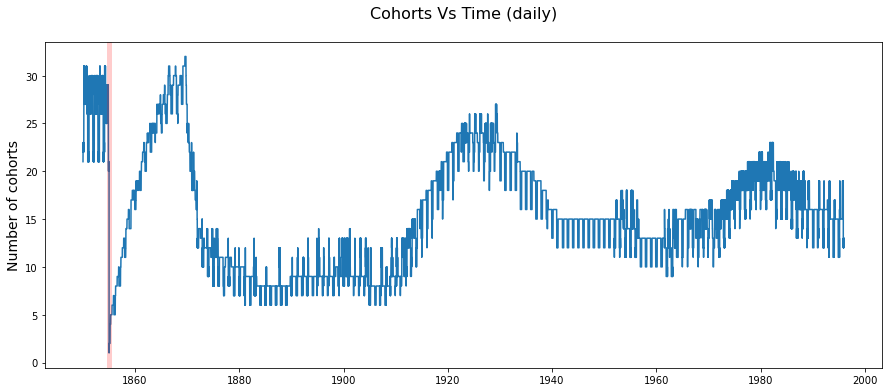

In [18]:
plt.figure(figsize=(15,6))
plt.plot(np.unique(df_vals['timex'], return_counts=1)[0], np.unique(df_vals['timex_code'], return_counts=1)[1])
plt.ylabel("Number of cohorts", fontsize =14)
plt.axvline(x = dt.date(1855,1,1), color = 'r',lw=5, alpha=.2)
plt.title( "Cohorts Vs Time (daily)\n", fontsize  = 16)

### FATES_NPP just for reference

Text(0.5, 1.0, 'FATES_NPP Annual Mean\n')

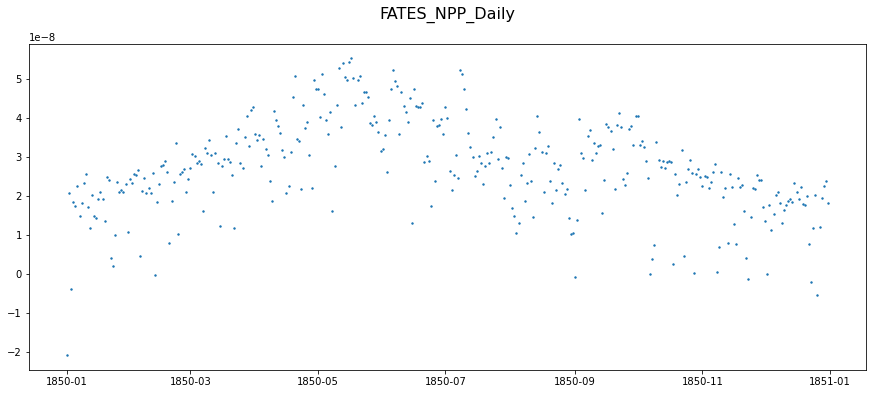

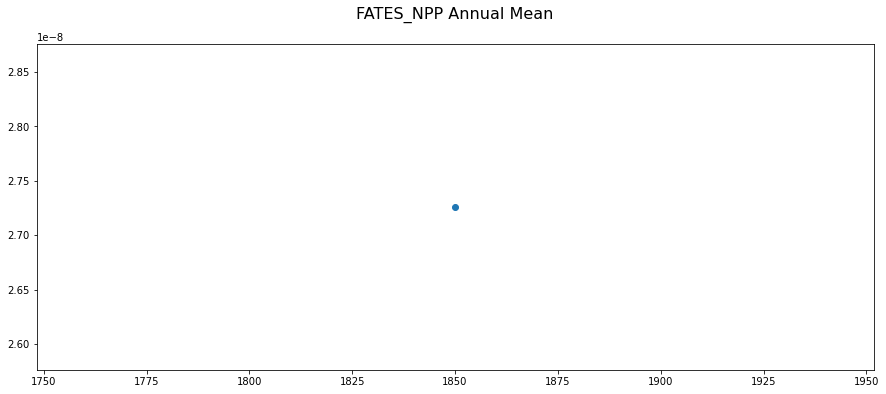

In [19]:
ts_data = ds[key]["FATES_NPP"]
#ts_data
plt.figure(figsize=(15,6))
plt.scatter(x=ts_data.time, y=ts_data, s=2)
plt.title( "FATES_NPP_Daily\n", fontsize  = 16)

plt.figure(figsize=(15,6))
ts_data = ts_data.groupby("time.year").mean('time')
plt.scatter(x=ts_data.year, y=ts_data)
plt.title( "FATES_NPP Annual Mean\n", fontsize  = 16)

## Plot of L2FR from print file

In [20]:
# Set the date range you want to subset between
start_date = '1854-01-01'
end_date = '1859-01-01'

# Create a boolean mask based on the date range
mask = (df_vals['timex'] >= start_date) & (df_vals['timex'] <= end_date)

# Subset the DataFrame based on the boolean mask
subset_df = df_vals[mask]
print (f"Maximum Cohorts: {max(np.unique(subset_df['timex_code'], return_counts=1)[1])}")


Maximum Cohorts: 31


In [21]:
# Plotting based on the cohort index

# initializing the cohort index to -1
subset_df['cohort_id'] = -1

# for every time step assign a unique index in the cohort id
for _, grp in subset_df.groupby('timex'):
    subset_df.loc[grp.index, "cohort_id"] = range(len(grp))

/var/folders/f1/01gxw8vn74q_x_rf_p5ztryjr405zq/T/ipykernel_60418/3966830711.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  subset_df['cohort_id'] = -1
/Users/ud4/opt/anaconda3/envs/pyces/lib/python3.9/site-packages/pandas/core/indexing.py:1773: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_column(ilocs[0], value, pi)


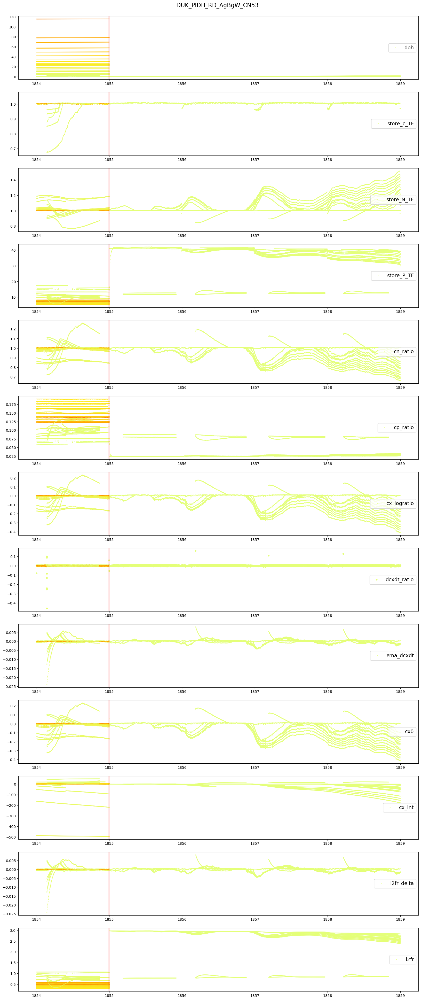

In [22]:

# Which CMAP coloring to chose
cmap_select = 'Wistia'


fig, axs = plt.subplots(13,1 , figsize=(20,50), dpi=100)

idx_ax = 0

axs[idx_ax].scatter(x=subset_df['timex'], y=subset_df['dbh'],  
                    marker='.', label = 'dbh', c=subset_df['dbh'], 
                    cmap=cmap_select, s=5)
axs[idx_ax].set_title(f"{key} \n",fontsize=16)
'''
axs[idx_ax].scatter(x=subset_df['timex'], y=subset_df['store_c_act'],  
                    marker='.', label = 'store_c_act', c=subset_df['cohort_id'], 
                    cmap=cmap_select, s=5)

idx_ax = idx_ax +1
axs[idx_ax].scatter(x=subset_df['timex'], y=subset_df['store_c_max'],  
                    marker='.', label = 'store_c_max', c=subset_df['cohort_id'], 
                    cmap=cmap_select, s=5)
'''
idx_ax = idx_ax +1
axs[idx_ax].scatter(x=subset_df['timex'], y=subset_df['store_c_act']/subset_df['store_c_max'],  
                    marker='.', label = 'store_c_TF', c=subset_df['dbh'], 
                    cmap=cmap_select, s=5)

idx_ax = idx_ax +1


'''
axs[idx_ax].scatter(x=subset_df['timex'], y=subset_df['store_nut_act'],  
                    marker='.', label = 'store_nut_act', c=subset_df['cohort_id'], 
                    cmap=cmap_select, s=5)

idx_ax = idx_ax +1
axs[idx_ax].scatter(x=subset_df['timex'], y=subset_df['store_nut_max'],  
                    marker='.', label = 'store_nut_max', c=subset_df['cohort_id'], 
                    cmap=cmap_select, s=5)
'''
axs[idx_ax].scatter(x=subset_df['timex'], y=subset_df['store_N_act']/subset_df['store_N_max'],  
                    marker='.', label = 'store_N_TF', c=subset_df['dbh'], 
                    cmap=cmap_select, s=5)

idx_ax = idx_ax +1

axs[idx_ax].scatter(x=subset_df['timex'], y=subset_df['store_P_act']/subset_df['store_P_max'],  
                    marker='.', label = 'store_P_TF', c=subset_df['dbh'], 
                    cmap=cmap_select, s=5)

idx_ax = idx_ax +1

axs[idx_ax].scatter(x=subset_df['timex'], y=subset_df['cn_ratio'],  
                    marker='.', label = 'cn_ratio', c=subset_df['dbh'], 
                    cmap=cmap_select, s=5)
idx_ax = idx_ax +1
axs[idx_ax].scatter(x=subset_df['timex'], y=subset_df['cp_ratio'],  
                    marker='.', label = 'cp_ratio', c=subset_df['dbh'], 
                    cmap=cmap_select, s=5)


idx_ax = idx_ax +1
axs[idx_ax].scatter(x=subset_df['timex'], y=subset_df['cx_logratio'],  
                    marker='.', label = 'cx_logratio', 
                    c=subset_df['dbh'],  cmap=cmap_select, s=5)

idx_ax = idx_ax +1
axs[idx_ax].scatter(x=subset_df['timex'], y=subset_df['dcxdt_ratio'],  
                    marker='o', label = 'dcxdt_ratio', c=subset_df['dbh'], 
                    cmap=cmap_select, s=15)

idx_ax = idx_ax +1
axs[idx_ax].scatter(x=subset_df['timex'], y=subset_df['ema_dcxdt'],  
                    marker='.', label = 'ema_dcxdt', c=subset_df['dbh'], 
                    cmap=cmap_select, s=5)

idx_ax = idx_ax +1
axs[idx_ax].scatter(x=subset_df['timex'], y=subset_df['cx0'],  
                    marker='.', label = 'cx0', c=subset_df['dbh'], 
                    cmap=cmap_select, s=5)

idx_ax = idx_ax +1
axs[idx_ax].scatter(x=subset_df['timex'], y=subset_df['cx_int'],  
                    marker='.', label = 'cx_int', c=subset_df['dbh'], 
                    cmap=cmap_select, s=5)

idx_ax = idx_ax +1
axs[idx_ax].scatter(x=subset_df['timex'], y=subset_df['l2fr_delta'],  
                    marker='.', label = 'l2fr_delta', 
                    c=subset_df['dbh'],  cmap=cmap_select, s=5)

idx_ax = idx_ax +1
axs[idx_ax].scatter(x=subset_df['timex'], y=subset_df['l2fr'],  
                    marker='.', label = 'l2fr', c=subset_df['dbh'], 
                    cmap=cmap_select, s=5)





for i in range(len(axs)): 
    axs[i].legend(loc=5, fontsize=14)
    axs[i].axvline(x = dt.date(1855,1,1), color = 'r',lw=5, alpha=.1)

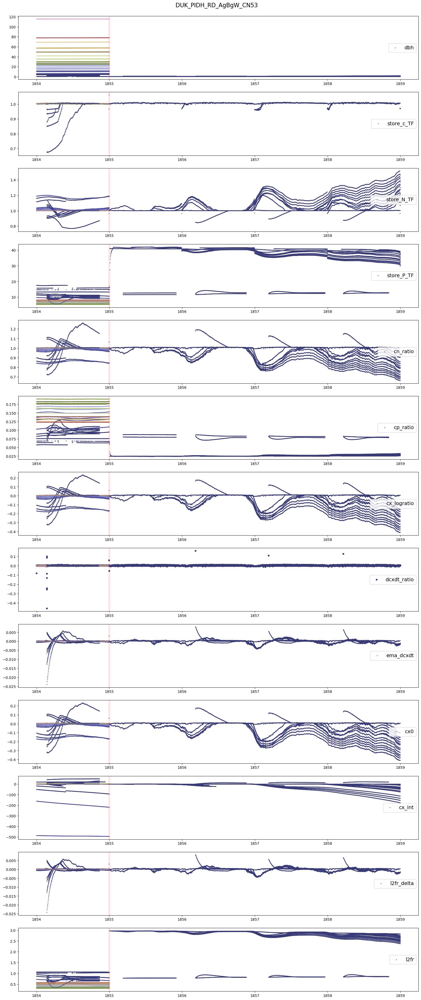

In [23]:

# Which CMAP coloring to chose
cmap_select = 'tab20b'


fig, axs = plt.subplots(13,1 , figsize=(20,50), dpi=100)

idx_ax = 0

axs[idx_ax].scatter(x=subset_df['timex'], y=subset_df['dbh'],  
                    marker='.', label = 'dbh', c=subset_df['dbh'], 
                    cmap=cmap_select, s=5)
axs[idx_ax].set_title(f"{key}  \n",fontsize=16)
'''
axs[idx_ax].scatter(x=subset_df['timex'], y=subset_df['store_c_act'],  
                    marker='.', label = 'store_c_act', c=subset_df['cohort_id'], 
                    cmap=cmap_select, s=5)

idx_ax = idx_ax +1
axs[idx_ax].scatter(x=subset_df['timex'], y=subset_df['store_c_max'],  
                    marker='.', label = 'store_c_max', c=subset_df['cohort_id'], 
                    cmap=cmap_select, s=5)
'''
idx_ax = idx_ax +1
axs[idx_ax].scatter(x=subset_df['timex'], y=subset_df['store_c_act']/subset_df['store_c_max'],  
                    marker='.', label = 'store_c_TF', c=subset_df['dbh'], 
                    cmap=cmap_select, s=5)

idx_ax = idx_ax +1


'''
axs[idx_ax].scatter(x=subset_df['timex'], y=subset_df['store_nut_act'],  
                    marker='.', label = 'store_nut_act', c=subset_df['cohort_id'], 
                    cmap=cmap_select, s=5)

idx_ax = idx_ax +1
axs[idx_ax].scatter(x=subset_df['timex'], y=subset_df['store_nut_max'],  
                    marker='.', label = 'store_nut_max', c=subset_df['cohort_id'], 
                    cmap=cmap_select, s=5)
'''
axs[idx_ax].scatter(x=subset_df['timex'], y=subset_df['store_N_act']/subset_df['store_N_max'],  
                    marker='.', label = 'store_N_TF', c=subset_df['dbh'], 
                    cmap=cmap_select, s=5)

idx_ax = idx_ax +1

axs[idx_ax].scatter(x=subset_df['timex'], y=subset_df['store_P_act']/subset_df['store_P_max'],  
                    marker='.', label = 'store_P_TF', c=subset_df['dbh'], 
                    cmap=cmap_select, s=5)

idx_ax = idx_ax +1

axs[idx_ax].scatter(x=subset_df['timex'], y=subset_df['cn_ratio'],  
                    marker='.', label = 'cn_ratio', c=subset_df['dbh'], 
                    cmap=cmap_select, s=5)
idx_ax = idx_ax +1
axs[idx_ax].scatter(x=subset_df['timex'], y=subset_df['cp_ratio'],  
                    marker='.', label = 'cp_ratio', c=subset_df['dbh'], 
                    cmap=cmap_select, s=5)


idx_ax = idx_ax +1
axs[idx_ax].scatter(x=subset_df['timex'], y=subset_df['cx_logratio'],  
                    marker='.', label = 'cx_logratio', 
                    c=subset_df['dbh'],  cmap=cmap_select, s=5)

idx_ax = idx_ax +1
axs[idx_ax].scatter(x=subset_df['timex'], y=subset_df['dcxdt_ratio'],  
                    marker='o', label = 'dcxdt_ratio', c=subset_df['dbh'], 
                    cmap=cmap_select, s=15)

idx_ax = idx_ax +1
axs[idx_ax].scatter(x=subset_df['timex'], y=subset_df['ema_dcxdt'],  
                    marker='.', label = 'ema_dcxdt', c=subset_df['dbh'], 
                    cmap=cmap_select, s=5)

idx_ax = idx_ax +1
axs[idx_ax].scatter(x=subset_df['timex'], y=subset_df['cx0'],  
                    marker='.', label = 'cx0', c=subset_df['dbh'], 
                    cmap=cmap_select, s=5)

idx_ax = idx_ax +1
axs[idx_ax].scatter(x=subset_df['timex'], y=subset_df['cx_int'],  
                    marker='.', label = 'cx_int', c=subset_df['dbh'], 
                    cmap=cmap_select, s=5)

idx_ax = idx_ax +1
axs[idx_ax].scatter(x=subset_df['timex'], y=subset_df['l2fr_delta'],  
                    marker='.', label = 'l2fr_delta', 
                    c=subset_df['dbh'],  cmap=cmap_select, s=5)

idx_ax = idx_ax +1
axs[idx_ax].scatter(x=subset_df['timex'], y=subset_df['l2fr'],  
                    marker='.', label = 'l2fr', c=subset_df['dbh'], 
                    cmap=cmap_select, s=5)





for i in range(len(axs)): 
    axs[i].legend(loc=5, fontsize=14)
    axs[i].axvline(x = dt.date(1855,1,1), color = 'r',lw=5, alpha=.1)

# Plotting for multiple decades

In [24]:
# Set the date range you want to subset between
start_date = '1854-01-01'
end_date = '1894-01-01'

# Create a boolean mask based on the date range
mask = (df_vals['timex'] >= start_date) & (df_vals['timex'] <= end_date)

# Subset the DataFrame based on the boolean mask
subset_df = df_vals[mask]
print (f"Maximum Cohorts: {max(np.unique(subset_df['timex_code'], return_counts=1)[1])}")


Maximum Cohorts: 32


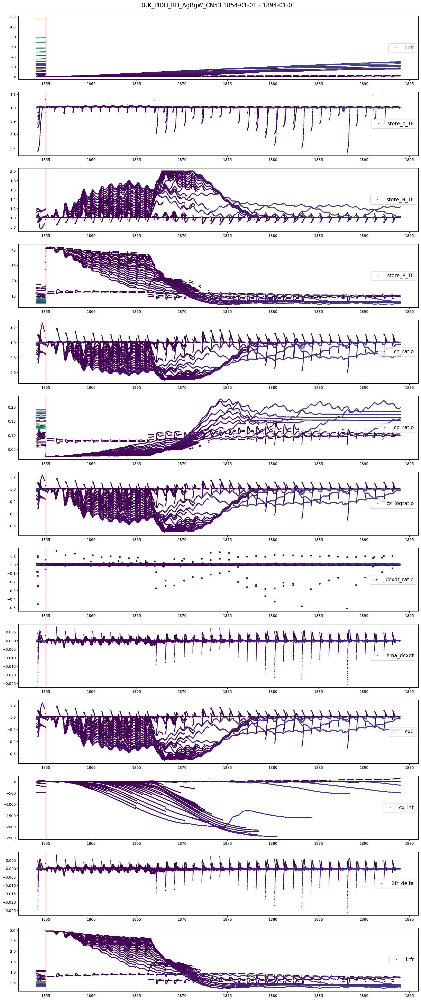

In [25]:

# Which CMAP coloring to chose
cmap_select = 'viridis'


fig, axs = plt.subplots(13,1 , figsize=(20,50), dpi=100)

idx_ax = 0

axs[idx_ax].scatter(x=subset_df['timex'], y=subset_df['dbh'],  
                    marker='.', label = 'dbh', c=subset_df['dbh'], 
                    cmap=cmap_select, s=5)
axs[idx_ax].set_title(f"{key} {start_date} - {end_date} \n",fontsize=16)
'''
axs[idx_ax].scatter(x=subset_df['timex'], y=subset_df['store_c_act'],  
                    marker='.', label = 'store_c_act', c=subset_df['cohort_id'], 
                    cmap=cmap_select, s=5)

idx_ax = idx_ax +1
axs[idx_ax].scatter(x=subset_df['timex'], y=subset_df['store_c_max'],  
                    marker='.', label = 'store_c_max', c=subset_df['cohort_id'], 
                    cmap=cmap_select, s=5)
'''
idx_ax = idx_ax +1
axs[idx_ax].scatter(x=subset_df['timex'], y=subset_df['store_c_act']/subset_df['store_c_max'],  
                    marker='.', label = 'store_c_TF', c=subset_df['dbh'], 
                    cmap=cmap_select, s=5)

idx_ax = idx_ax +1


'''
axs[idx_ax].scatter(x=subset_df['timex'], y=subset_df['store_nut_act'],  
                    marker='.', label = 'store_nut_act', c=subset_df['cohort_id'], 
                    cmap=cmap_select, s=5)

idx_ax = idx_ax +1
axs[idx_ax].scatter(x=subset_df['timex'], y=subset_df['store_nut_max'],  
                    marker='.', label = 'store_nut_max', c=subset_df['cohort_id'], 
                    cmap=cmap_select, s=5)
'''
axs[idx_ax].scatter(x=subset_df['timex'], y=subset_df['store_N_act']/subset_df['store_N_max'],  
                    marker='.', label = 'store_N_TF', c=subset_df['dbh'], 
                    cmap=cmap_select, s=5)

idx_ax = idx_ax +1

axs[idx_ax].scatter(x=subset_df['timex'], y=subset_df['store_P_act']/subset_df['store_P_max'],  
                    marker='.', label = 'store_P_TF', c=subset_df['dbh'], 
                    cmap=cmap_select, s=5)

idx_ax = idx_ax +1

axs[idx_ax].scatter(x=subset_df['timex'], y=subset_df['cn_ratio'],  
                    marker='.', label = 'cn_ratio', c=subset_df['dbh'], 
                    cmap=cmap_select, s=5)
idx_ax = idx_ax +1
axs[idx_ax].scatter(x=subset_df['timex'], y=subset_df['cp_ratio'],  
                    marker='.', label = 'cp_ratio', c=subset_df['dbh'], 
                    cmap=cmap_select, s=5)


idx_ax = idx_ax +1
axs[idx_ax].scatter(x=subset_df['timex'], y=subset_df['cx_logratio'],  
                    marker='.', label = 'cx_logratio', 
                    c=subset_df['dbh'],  cmap=cmap_select, s=5)

idx_ax = idx_ax +1
axs[idx_ax].scatter(x=subset_df['timex'], y=subset_df['dcxdt_ratio'],  
                    marker='o', label = 'dcxdt_ratio', c=subset_df['dbh'], 
                    cmap=cmap_select, s=15)

idx_ax = idx_ax +1
axs[idx_ax].scatter(x=subset_df['timex'], y=subset_df['ema_dcxdt'],  
                    marker='.', label = 'ema_dcxdt', c=subset_df['dbh'], 
                    cmap=cmap_select, s=5)

idx_ax = idx_ax +1
axs[idx_ax].scatter(x=subset_df['timex'], y=subset_df['cx0'],  
                    marker='.', label = 'cx0', c=subset_df['dbh'], 
                    cmap=cmap_select, s=5)

idx_ax = idx_ax +1
axs[idx_ax].scatter(x=subset_df['timex'], y=subset_df['cx_int'],  
                    marker='.', label = 'cx_int', c=subset_df['dbh'], 
                    cmap=cmap_select, s=5)

idx_ax = idx_ax +1
axs[idx_ax].scatter(x=subset_df['timex'], y=subset_df['l2fr_delta'],  
                    marker='.', label = 'l2fr_delta', 
                    c=subset_df['dbh'],  cmap=cmap_select, s=5)

idx_ax = idx_ax +1
axs[idx_ax].scatter(x=subset_df['timex'], y=subset_df['l2fr'],  
                    marker='.', label = 'l2fr', c=subset_df['dbh'], 
                    cmap=cmap_select, s=5)





for i in range(len(axs)): 
    axs[i].legend(loc=5, fontsize=14)
    axs[i].axvline(x = dt.date(1855,1,1), color = 'r',lw=5, alpha=.1)

# Ploting only after logging

In [26]:
# Set the date range you want to subset between
start_date = '1855-01-02'
end_date = '1894-01-01'

# Create a boolean mask based on the date range
mask = (df_vals['timex'] >= start_date) & (df_vals['timex'] <= end_date)

# Subset the DataFrame based on the boolean mask
subset_df = df_vals[mask]
print (f"Maximum Cohorts: {max(np.unique(subset_df['timex_code'], return_counts=1)[1])}")


Maximum Cohorts: 32


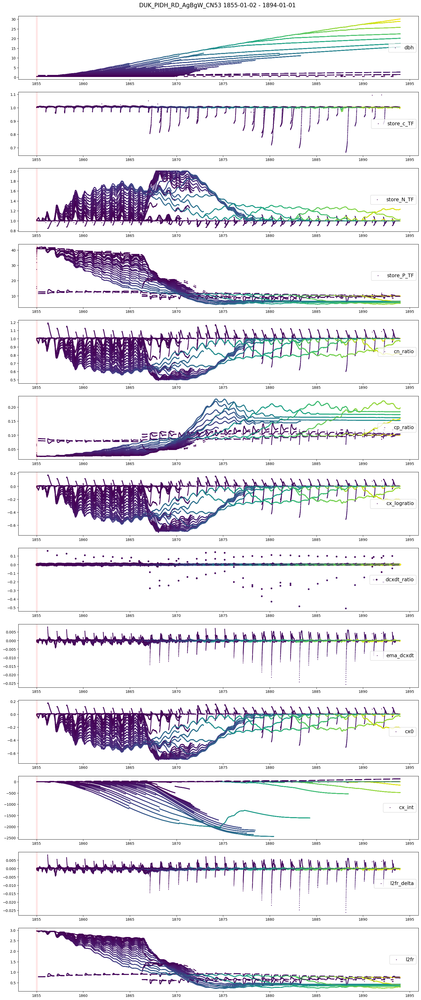

In [27]:

# Which CMAP coloring to chose
cmap_select = 'viridis'


fig, axs = plt.subplots(13,1 , figsize=(20,50), dpi=100)

idx_ax = 0

axs[idx_ax].scatter(x=subset_df['timex'], y=subset_df['dbh'],  
                    marker='.', label = 'dbh', c=subset_df['dbh'], 
                    cmap=cmap_select, s=5)
axs[idx_ax].set_title(f"{key} {start_date} - {end_date} \n",fontsize=16)
'''
axs[idx_ax].scatter(x=subset_df['timex'], y=subset_df['store_c_act'],  
                    marker='.', label = 'store_c_act', c=subset_df['cohort_id'], 
                    cmap=cmap_select, s=5)

idx_ax = idx_ax +1
axs[idx_ax].scatter(x=subset_df['timex'], y=subset_df['store_c_max'],  
                    marker='.', label = 'store_c_max', c=subset_df['cohort_id'], 
                    cmap=cmap_select, s=5)
'''
idx_ax = idx_ax +1
axs[idx_ax].scatter(x=subset_df['timex'], y=subset_df['store_c_act']/subset_df['store_c_max'],  
                    marker='.', label = 'store_c_TF', c=subset_df['dbh'], 
                    cmap=cmap_select, s=5)

idx_ax = idx_ax +1


'''
axs[idx_ax].scatter(x=subset_df['timex'], y=subset_df['store_nut_act'],  
                    marker='.', label = 'store_nut_act', c=subset_df['cohort_id'], 
                    cmap=cmap_select, s=5)

idx_ax = idx_ax +1
axs[idx_ax].scatter(x=subset_df['timex'], y=subset_df['store_nut_max'],  
                    marker='.', label = 'store_nut_max', c=subset_df['cohort_id'], 
                    cmap=cmap_select, s=5)
'''
axs[idx_ax].scatter(x=subset_df['timex'], y=subset_df['store_N_act']/subset_df['store_N_max'],  
                    marker='.', label = 'store_N_TF', c=subset_df['dbh'], 
                    cmap=cmap_select, s=5)

idx_ax = idx_ax +1

axs[idx_ax].scatter(x=subset_df['timex'], y=subset_df['store_P_act']/subset_df['store_P_max'],  
                    marker='.', label = 'store_P_TF', c=subset_df['dbh'], 
                    cmap=cmap_select, s=5)

idx_ax = idx_ax +1

axs[idx_ax].scatter(x=subset_df['timex'], y=subset_df['cn_ratio'],  
                    marker='.', label = 'cn_ratio', c=subset_df['dbh'], 
                    cmap=cmap_select, s=5)
idx_ax = idx_ax +1
axs[idx_ax].scatter(x=subset_df['timex'], y=subset_df['cp_ratio'],  
                    marker='.', label = 'cp_ratio', c=subset_df['dbh'], 
                    cmap=cmap_select, s=5)


idx_ax = idx_ax +1
axs[idx_ax].scatter(x=subset_df['timex'], y=subset_df['cx_logratio'],  
                    marker='.', label = 'cx_logratio', 
                    c=subset_df['dbh'],  cmap=cmap_select, s=5)

idx_ax = idx_ax +1
axs[idx_ax].scatter(x=subset_df['timex'], y=subset_df['dcxdt_ratio'],  
                    marker='o', label = 'dcxdt_ratio', c=subset_df['dbh'], 
                    cmap=cmap_select, s=15)

idx_ax = idx_ax +1
axs[idx_ax].scatter(x=subset_df['timex'], y=subset_df['ema_dcxdt'],  
                    marker='.', label = 'ema_dcxdt', c=subset_df['dbh'], 
                    cmap=cmap_select, s=5)

idx_ax = idx_ax +1
axs[idx_ax].scatter(x=subset_df['timex'], y=subset_df['cx0'],  
                    marker='.', label = 'cx0', c=subset_df['dbh'], 
                    cmap=cmap_select, s=5)

idx_ax = idx_ax +1
axs[idx_ax].scatter(x=subset_df['timex'], y=subset_df['cx_int'],  
                    marker='.', label = 'cx_int', c=subset_df['dbh'], 
                    cmap=cmap_select, s=5)

idx_ax = idx_ax +1
axs[idx_ax].scatter(x=subset_df['timex'], y=subset_df['l2fr_delta'],  
                    marker='.', label = 'l2fr_delta', 
                    c=subset_df['dbh'],  cmap=cmap_select, s=5)

idx_ax = idx_ax +1
axs[idx_ax].scatter(x=subset_df['timex'], y=subset_df['l2fr'],  
                    marker='.', label = 'l2fr', c=subset_df['dbh'], 
                    cmap=cmap_select, s=5)





for i in range(len(axs)): 
    axs[i].legend(loc=5, fontsize=14)
    axs[i].axvline(x = dt.date(1855,1,1), color = 'r',lw=5, alpha=.1)

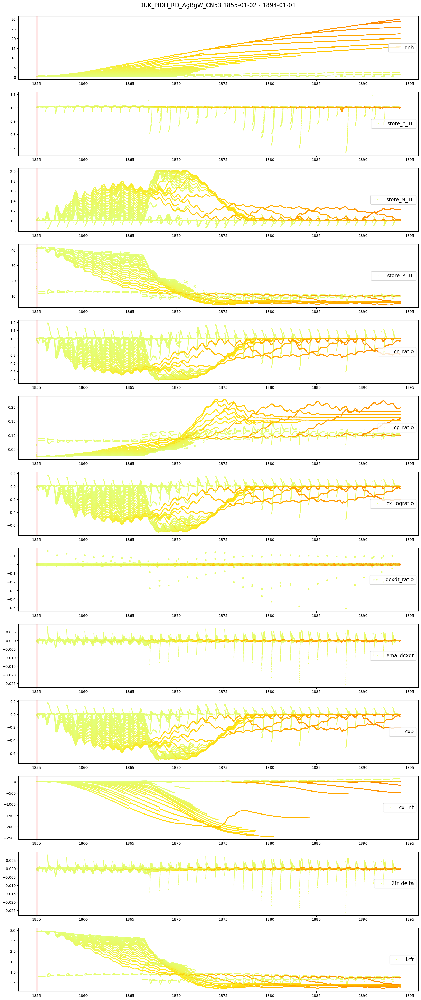

In [28]:

# Which CMAP coloring to chose
cmap_select = 'Wistia'


fig, axs = plt.subplots(13,1 , figsize=(20,50), dpi=100)

idx_ax = 0

axs[idx_ax].scatter(x=subset_df['timex'], y=subset_df['dbh'],  
                    marker='.', label = 'dbh', c=subset_df['dbh'], 
                    cmap=cmap_select, s=5)
axs[idx_ax].set_title(f"{key} {start_date} - {end_date} \n",fontsize=16)
'''
axs[idx_ax].scatter(x=subset_df['timex'], y=subset_df['store_c_act'],  
                    marker='.', label = 'store_c_act', c=subset_df['cohort_id'], 
                    cmap=cmap_select, s=5)

idx_ax = idx_ax +1
axs[idx_ax].scatter(x=subset_df['timex'], y=subset_df['store_c_max'],  
                    marker='.', label = 'store_c_max', c=subset_df['cohort_id'], 
                    cmap=cmap_select, s=5)
'''
idx_ax = idx_ax +1
axs[idx_ax].scatter(x=subset_df['timex'], y=subset_df['store_c_act']/subset_df['store_c_max'],  
                    marker='.', label = 'store_c_TF', c=subset_df['dbh'], 
                    cmap=cmap_select, s=5)

idx_ax = idx_ax +1


'''
axs[idx_ax].scatter(x=subset_df['timex'], y=subset_df['store_nut_act'],  
                    marker='.', label = 'store_nut_act', c=subset_df['cohort_id'], 
                    cmap=cmap_select, s=5)

idx_ax = idx_ax +1
axs[idx_ax].scatter(x=subset_df['timex'], y=subset_df['store_nut_max'],  
                    marker='.', label = 'store_nut_max', c=subset_df['cohort_id'], 
                    cmap=cmap_select, s=5)
'''
axs[idx_ax].scatter(x=subset_df['timex'], y=subset_df['store_N_act']/subset_df['store_N_max'],  
                    marker='.', label = 'store_N_TF', c=subset_df['dbh'], 
                    cmap=cmap_select, s=5)

idx_ax = idx_ax +1

axs[idx_ax].scatter(x=subset_df['timex'], y=subset_df['store_P_act']/subset_df['store_P_max'],  
                    marker='.', label = 'store_P_TF', c=subset_df['dbh'], 
                    cmap=cmap_select, s=5)

idx_ax = idx_ax +1

axs[idx_ax].scatter(x=subset_df['timex'], y=subset_df['cn_ratio'],  
                    marker='.', label = 'cn_ratio', c=subset_df['dbh'], 
                    cmap=cmap_select, s=5)
idx_ax = idx_ax +1
axs[idx_ax].scatter(x=subset_df['timex'], y=subset_df['cp_ratio'],  
                    marker='.', label = 'cp_ratio', c=subset_df['dbh'], 
                    cmap=cmap_select, s=5)


idx_ax = idx_ax +1
axs[idx_ax].scatter(x=subset_df['timex'], y=subset_df['cx_logratio'],  
                    marker='.', label = 'cx_logratio', 
                    c=subset_df['dbh'],  cmap=cmap_select, s=5)

idx_ax = idx_ax +1
axs[idx_ax].scatter(x=subset_df['timex'], y=subset_df['dcxdt_ratio'],  
                    marker='o', label = 'dcxdt_ratio', c=subset_df['dbh'], 
                    cmap=cmap_select, s=15)

idx_ax = idx_ax +1
axs[idx_ax].scatter(x=subset_df['timex'], y=subset_df['ema_dcxdt'],  
                    marker='.', label = 'ema_dcxdt', c=subset_df['dbh'], 
                    cmap=cmap_select, s=5)

idx_ax = idx_ax +1
axs[idx_ax].scatter(x=subset_df['timex'], y=subset_df['cx0'],  
                    marker='.', label = 'cx0', c=subset_df['dbh'], 
                    cmap=cmap_select, s=5)

idx_ax = idx_ax +1
axs[idx_ax].scatter(x=subset_df['timex'], y=subset_df['cx_int'],  
                    marker='.', label = 'cx_int', c=subset_df['dbh'], 
                    cmap=cmap_select, s=5)

idx_ax = idx_ax +1
axs[idx_ax].scatter(x=subset_df['timex'], y=subset_df['l2fr_delta'],  
                    marker='.', label = 'l2fr_delta', 
                    c=subset_df['dbh'],  cmap=cmap_select, s=5)

idx_ax = idx_ax +1
axs[idx_ax].scatter(x=subset_df['timex'], y=subset_df['l2fr'],  
                    marker='.', label = 'l2fr', c=subset_df['dbh'], 
                    cmap=cmap_select, s=5)





for i in range(len(axs)): 
    axs[i].legend(loc=5, fontsize=14)
    axs[i].axvline(x = dt.date(1855,1,1), color = 'r',lw=5, alpha=.1)

In [ ]:
# Checking if the l2fr values (sum over all cohorts) from the print are same as l2fr variable output
max_vals = 5000
sum_l2fr = df_vals.groupby('timex_code')['l2fr'].sum().reset_index()[:max_vals]
mean_l2fr = df_vals.groupby('timex_code')['l2fr'].mean().reset_index()[:max_vals]
min_l2fr = df_vals.groupby('timex_code')['l2fr'].min().reset_index()[:max_vals]
max_l2fr = df_vals.groupby('timex_code')['l2fr'].max().reset_index()[:max_vals]

In [ ]:
# Reading daily l2fr files FATES output
#list_of_d_files= glob.glob(f"/Users/ud4/FATESMDS_analysis/outputs/runs/tests_alp/230309/run/Bharat_AW_Nalloc_mf0df100_r0725_Test_PIDE_AgBgW_RD_US-DUK_I20TRELMFATES.elm.h0.*.nc")
#ds_FATES_daily = xr.open_mfdataset(f"/Users/ud4/FATESMDS_analysis/outputs/runs/tests_alp/230309/run/Bharat_AW_Nalloc_mf0df100_r0725_Test_PIDE_AgBgW_RD_US-DUK_I20TRELMFATES.elm.h0.*.nc")

In [ ]:
#sum_l2fr['l2fr'].plot()

fig1, ax = plt.subplots(figsize=(30, 6))
scatter = ax.scatter(x=range(len(sum_l2fr['l2fr'])), y = sum_l2fr['l2fr'], c=sum_l2fr['l2fr'], cmap='viridis', marker='o', label = 'sum_l2fr')
plt.legend()

In [ ]:
#mean_l2fr['l2fr'].plot()

fig1, ax = plt.subplots(figsize=(30, 6))
scatter = ax.scatter(x=range(len(mean_l2fr['l2fr'])), y = mean_l2fr['l2fr'], c=mean_l2fr['l2fr'], cmap='viridis', marker='o', label = 'mean_l2fr')
plt.legend()

In [ ]:
#min_l2fr['l2fr'].plot()


fig, ax = plt.subplots(figsize=(30, 6))
scatter = ax.scatter(x=range(len(min_l2fr['l2fr'])), y = min_l2fr['l2fr'], c=min_l2fr['l2fr'], cmap='viridis', marker='o', label = 'min_l2fr')
plt.legend()

In [ ]:
#max_l2fr['l2fr'].plot()


fig, ax = plt.subplots(figsize=(30, 6))
scatter = ax.scatter(x=range(len(max_l2fr['l2fr'])), y = max_l2fr['l2fr'], c=max_l2fr['l2fr'], cmap='viridis', marker='o', label = 'max_l2fr')
plt.legend()

In [ ]:

fig, ax = plt.subplots(figsize=(30, 6))
scatter = ax.scatter(ds[key]['FATES_L2FR'].time, ds[key]['FATES_L2FR'], c=ds[key]['FATES_L2FR'], cmap='viridis', marker='o', label = 'FATES_L2FR_yrly')
plt.legend()

In [ ]:

ts_data_l2fr = ds[key]['FATES_L2FR'][idx_start_date:idx_start_date+Yrs_Next*365]

fig, ax = plt.subplots(figsize=(30, 6))
scatter = ax.scatter(ts_data_l2fr.time, ts_data_l2fr, c=ts_data_l2fr, cmap='viridis', marker='o', label = 'FATES_L2FR_Daily')
plt.legend()
ax.axvline(x = dt.date(1855,1,1), color = 'r',lw=5, alpha=.1)

In [ ]:
print ("\nAll Plots >>>>>>")

idx_start_date = 5*365 # Jan 1, 1855

# For multiple variables on a same plot upto 5 years after logging 
Yrs_Next = 5 # upto 5 years after logging 

fig, axs = plt.subplots(9,1 , figsize=(15,30), dpi=400)

# Subplot 1 >>>
idx_ax = 0
var = "FATES_NPP"
# C-only
sim_conly = sims.replace("RD", "Conly")
if sims == "DUK_PIDE_RD_AgBgW_testing" : 
    sim_conly = "DUK_PIDE_Conly_AgBgW"
key=sim_conly
ts_data = ds[key][var][idx_start_date:idx_start_date+Yrs_Next*365] # Daily data range from logging date to next five years
axs[idx_ax].scatter(ts_data.time, ts_data, marker=".", label = var + " C-only",alpha=.2)
# RD
key=sims
ts_data = ds[key][var][idx_start_date:idx_start_date+Yrs_Next*365] # Daily data range from logging date to next five years
axs[idx_ax].scatter(ts_data.time, ts_data, marker=".", label = var ,alpha=.2)
axs[idx_ax].set_ylabel (f"{ds[key][var].units}")
axs[idx_ax].set_title(f"{key} Daily Logging + 5 years (Scatter) \n",fontsize=16)
axs[idx_ax].axhline(y = 0, color = 'r',lw=1, alpha=.1)

print(key)
# Subplot 1 <<<

# Subplot 2 >>>
idx_ax = 1
vars_plot = (
"""
FATES_STOREC_TF
FATES_STOREC
"""
).split('\n')
vars_plot = vars_plot[1:-1]
var = vars_plot[0]
ts_data = ds[key][var][idx_start_date:idx_start_date+Yrs_Next*365] # Daily data range from logging date to next five years
axs[idx_ax].scatter(ts_data.time, ts_data, marker=".", label = var,alpha=.2)
axs[idx_ax].set_ylabel (f"{ds[key][var].units}")
ax_tmp = axs[idx_ax].twinx()
var = vars_plot[1]
ts_data = ds[key][var][idx_start_date:idx_start_date+Yrs_Next*365] # Daily data range from logging date to next five years
ax_tmp.scatter(ts_data.time,ts_data,marker=".", color='k', label = var, alpha=.3)
ax_tmp.legend(loc = 5)
ax_tmp.set_ylabel (f"{var}({ds[key][var].units})")
ax_tmp.axhline(y = 0, color = 'r',lw=1, alpha=.1)
# Subplot 2 <<<

# Subplot 3 >>>
idx_ax = 2
vars_plot = (
"""
FATES_STOREN_TF
FATES_STOREN
"""
).split('\n')
vars_plot = vars_plot[1:-1]
var = vars_plot[0]
ts_data = ds[key][var][idx_start_date:idx_start_date+Yrs_Next*365] # Daily data range from logging date to next five years
axs[idx_ax].scatter(ts_data.time, ts_data, marker=".", label = var,alpha=.2)
axs[idx_ax].set_ylabel (f"{ds[key][var].units}")
ax_tmp = axs[idx_ax].twinx()
var = vars_plot[1]
ts_data = ds[key][var][idx_start_date:idx_start_date+Yrs_Next*365] # Daily data range from logging date to next five years
ax_tmp.scatter(ts_data.time,ts_data, marker=".", color='k',label = var, alpha=.3)
ax_tmp.set_ylabel (f"{var}({ds[key][var].units})")
ax_tmp.legend(loc = 5)
ax_tmp.axhline(y = 0, color = 'r',lw=1, alpha=.1)

# Subplot 3 <<<
# Subplot 4 >>>
idx_ax = 3
ts_data = (ds[key]["FATES_STOREC_TF"]/ds[key]["FATES_STOREN_TF"])[idx_start_date:idx_start_date+Yrs_Next*365] # Daily data range from logging date to next five years
axs[idx_ax].scatter(ts_data.time, ts_data, label = "FATES_STOREC_TF/FATES_STOREN_TF",alpha=.2)
axs[idx_ax].set_ylabel (f"FATES_STOREC_TF/FATES_STOREN_TF")
ax_tmp = axs[idx_ax].twinx()
ts_data = (ds[key]["FATES_STOREC"]/ds[key]["FATES_STOREN"])[idx_start_date:idx_start_date+Yrs_Next*365] # Daily data range from logging date to next five years
ax_tmp.scatter(ts_data.time, ts_data,  marker=".", color='k', label = "FATES_STOREC/FATES_STOREN",alpha=.2)
ax_tmp.legend(loc = 5)

ax_tmp.set_ylabel (f"FATES_STOREC/FATES_STOREN")
# Subplot 4 <<<


# Subplot 5 >>>
idx_ax = 4
ts_data = (ds[key]["FATES_FROOT_ALLOC"]/ds[key]["FATES_LEAF_ALLOC"])[idx_start_date:idx_start_date+Yrs_Next*365] # Daily data range from logging date to next five years
axs[idx_ax].scatter(ts_data.time, ts_data, label = "FATES_FROOT_ALLOC/FATES_LEAF_ALLOC",alpha=.2)
axs[idx_ax].set_ylabel (f"FATES_FROOT_ALLOC/FATES_LEAF_ALLOC")
ax_tmp = axs[idx_ax].twinx()
ts_data = ds[key]["FATES_L2FR"][idx_start_date:idx_start_date+Yrs_Next*365] # Daily data range from logging date to next five years
ax_tmp.scatter(ts_data.time, ts_data,  marker=".", color='k', label = "FATES_L2FR",alpha=.2)
ax_tmp.set_ylabel (f"{ds[key]['FATES_L2FR'].units}")
ax_tmp.legend(loc = 5)
# Subplot 5 <<<

# Subplot 6 >>>
idx_ax = 5
vars_plot = (
"""
FATES_LEAFC
FATES_FROOTC
"""
).split('\n')
vars_plot = vars_plot[1:-1]
for i_var,var in enumerate(vars_plot):
    ts_data = ds[key][var][idx_start_date:idx_start_date+Yrs_Next*365] # Daily data range from logging date to next five years
    axs[idx_ax].scatter(ts_data.time, ts_data, label = var,alpha=.2)
axs[idx_ax].set_ylabel (f"{ds[key][var].units}")
ax_tmp = axs[idx_ax].twinx()
ts_data = (ds[key]["FATES_FROOTC"]/ds[key]["FATES_LEAFC"])[idx_start_date:idx_start_date+Yrs_Next*365] # Daily data range from logging date to next five years
ax_tmp.scatter(ts_data.time, ts_data,  marker=".", color='k', label = "FATES_FROOTC/FATES_LEAFC",alpha=.2)
ax_tmp.legend(loc = 5)
ax_tmp.set_ylabel (f"Unitless")

# Subplot 6 <<<

# Subplot 7 >>>
idx_ax = 6
vars_plot = (
"""
FATES_NO3UPTAKE
FATES_NH4UPTAKE
"""
).split('\n')
vars_plot = vars_plot[1:-1]
var = vars_plot[0]
ts_data = ds[key][var][idx_start_date:idx_start_date+Yrs_Next*365] # Daily data range from logging date to next five years
axs[idx_ax].scatter(ts_data.time, ts_data, label = var,alpha=.2)
axs[idx_ax].set_ylabel (f"{ds[key][var].units}")
axs[idx_ax].axhline(y = 0, color = 'r',lw=1, alpha=.1)
ax_tmp = axs[idx_ax].twinx()
var = vars_plot[1]
ts_data = ds[key][var][idx_start_date:idx_start_date+Yrs_Next*365] # Daily data range from logging date to next five years
ax_tmp.scatter(ts_data.time,ts_data, marker=".", color='k',  label = var,alpha=.2)
ax_tmp.set_ylabel (f"{var}({ds[key][var].units})")
ax_tmp.legend(loc = 5)
# Subplot 7 <<<

# Subplot 8 >>>
idx_ax = 7
vars_plot = (
"""
GROSS_NMIN
NET_NMIN
"""
).split('\n')
vars_plot = vars_plot[1:-1]
for i_var,var in enumerate(vars_plot):
    ts_data = ds[key][var][idx_start_date:idx_start_date+Yrs_Next*365] # Daily data range from logging date to next five years
    axs[idx_ax].scatter(ts_data.time, ts_data, label = var,alpha=.2)
axs[idx_ax].set_ylabel (f"{ds[key][var].units}")
axs[idx_ax].axhline(y = 0, color = 'r',lw=1, alpha=.1)
# Subplot 8 <<<

# Subplot 9 >>>
idx_ax = 8
vars_plot = (
"""
SMIN_NO3_LEACHED
DENIT
"""
).split('\n')
vars_plot = vars_plot[1:-1]
for i_var,var in enumerate(vars_plot):
    ts_data = ds[key][var][idx_start_date:idx_start_date+Yrs_Next*365] # Daily data range from logging date to next five years
    axs[idx_ax].scatter(ts_data.time, ts_data, label = var,alpha=.2)
axs[idx_ax].set_ylabel (f"{ds[key][var].units}")
axs[idx_ax].axhline(y = 0, color = 'r',lw=1, alpha=.1)
# Subplot 9 <<<
print(key)
for i in range(len(axs)): 
    axs[i].legend()
    axs[i].axvline(x = dt.date(1855,1,1), color = 'g',lw=5, alpha=.1)
#fig.savefig('./Plots/' + f'{key}_Scatter_daily.pdf',bbox_inches='tight')
#fig.savefig('./Plots/' + f'{key}_Scatter_daily.png',bbox_inches='tight')


In [ ]:
print ("\nAll Plots >>>>>>")
# For multiple variables on a same plot
fig, axs = plt.subplots(9,1 , figsize=(15,30), dpi=400)

# Subplot 1 >>>
idx_ax = 0
var = "FATES_NPP"
# C-only
sim_conly = sims.replace("RD", "Conly")
if sims == "DUK_PIDE_RD_AgBgW_testing" : 
    sim_conly = "DUK_PIDE_Conly_AgBgW"
key=sim_conly
ts_data = ds[key][var].groupby("time.year").mean('time')
axs[idx_ax].plot(ts_data.year, ts_data, label = var + " C-only")
# RD
key=sims
ts_data = ds[key][var].groupby("time.year").mean('time')
axs[idx_ax].plot(ts_data.year, ts_data, label = var )
axs[idx_ax].set_ylabel (f"{ds[key][var].units}")
axs[idx_ax].set_title(f"{key} Annual Mean\n",fontsize=16)

# Subplot 1 <<<

# Subplot 2 >>>
idx_ax = 1
vars_plot = (
"""
FATES_STOREC_TF
FATES_STOREC
"""
).split('\n')
vars_plot = vars_plot[1:-1]
var = vars_plot[0]
ts_data = ds[key][var].groupby("time.year").mean('time')
axs[idx_ax].plot(ts_data.year, ts_data, label = var)
axs[idx_ax].set_ylabel (f"{ds[key][var].units}")
ax_tmp = axs[idx_ax].twinx()
var = vars_plot[1]
ts_data = ds[key][var].groupby("time.year").mean('time')
ax_tmp.plot(ts_data.year,ts_data,'k+',  label = var)
ax_tmp.legend(loc = 5)
ax_tmp.set_ylabel (f"{var}({ds[key][var].units})")
ax_tmp.axhline(y = 0, color = 'r',lw=1, alpha=.1)
# Subplot 2 <<<

# Subplot 3 >>>
idx_ax = 2
vars_plot = (
"""
FATES_STOREN_TF
FATES_STOREN
"""
).split('\n')
vars_plot = vars_plot[1:-1]
var = vars_plot[0]
ts_data = ds[key][var].groupby("time.year").mean('time')
axs[idx_ax].plot(ts_data.year, ts_data, label = var)
axs[idx_ax].set_ylabel (f"{ds[key][var].units}")
ax_tmp = axs[idx_ax].twinx()
var = vars_plot[1]
ts_data = ds[key][var].groupby("time.year").mean('time')
ax_tmp.plot(ts_data.year,ts_data,'k+',  label = var)
ax_tmp.set_ylabel (f"{var}({ds[key][var].units})")
ax_tmp.legend(loc = 5)
ax_tmp.axhline(y = 0, color = 'r',lw=1, alpha=.1)

# Subplot 3 <<<

# Subplot 4 >>>
idx_ax = 3
ts_data = (ds[key]["FATES_STOREC_TF"]/ds[key]["FATES_STOREN_TF"]).groupby("time.year").mean('time')
axs[idx_ax].plot(ts_data.year, ts_data, label = "FATES_STOREC_TF/FATES_STOREN_TF")
axs[idx_ax].set_ylabel (f"{ds[key][var].units}")
ax_tmp = axs[idx_ax].twinx()
ts_data = (ds[key]["FATES_STOREC"]/ds[key]["FATES_STOREN"]).groupby("time.year").mean('time')
ax_tmp.plot(ts_data.year, ts_data, 'k+', label = "FATES_STOREC/FATES_STOREN")
ax_tmp.legend(loc = 5)
ax_tmp.set_ylabel (f"{var}({ds[key][var].units})")
# Subplot 4 <<<

# Subplot 5 >>>
idx_ax = 4
ts_data = (ds[key]["FATES_FROOT_ALLOC"]/ds[key]["FATES_LEAF_ALLOC"]).groupby("time.year").mean('time')
axs[idx_ax].plot(ts_data.year, ts_data, label = "FATES_FROOT_ALLOC/FATES_LEAF_ALLOC")
#axs[idx_ax].set_ylabel (f"{ds[key][var].units}")
ax_tmp = axs[idx_ax].twinx()
ts_data = ds[key]["FATES_L2FR"].groupby("time.year").mean('time')
ax_tmp.plot(ts_data.year, ts_data,'k+', label = "FATES_L2FR")
ax_tmp.set_ylabel (f"{ds[key]['FATES_L2FR'].units}")
ax_tmp.legend(loc = 5)
# Subplot 5 <<<

# Subplot 6 >>>
idx_ax = 5
vars_plot = (
"""
FATES_LEAFC
FATES_FROOTC
"""
).split('\n')
vars_plot = vars_plot[1:-1]
for i_var,var in enumerate(vars_plot):
    ts_data = ds[key][var].groupby("time.year").mean('time')
    axs[idx_ax].plot(ts_data.year, ts_data, label = var)
axs[idx_ax].set_ylabel (f"{ds[key][var].units}")
ax_tmp = axs[idx_ax].twinx()
ts_data = (ds[key]["FATES_FROOTC"]/ds[key]["FATES_LEAFC"]).groupby("time.year").mean('time')
ax_tmp.plot(ts_data.year, ts_data, 'k+', label = "FATES_FROOTC/FATES_LEAFC")
ax_tmp.legend(loc = 1)
ax_tmp.set_ylabel (f"Unitless")

# Subplot 6 <<<

# Subplot 7 >>>
idx_ax = 6
vars_plot = (
"""
FATES_NO3UPTAKE
FATES_NH4UPTAKE
"""
).split('\n')
vars_plot = vars_plot[1:-1]
var = vars_plot[0]
ts_data = ds[key][var].groupby("time.year").mean('time')
axs[idx_ax].plot(ts_data.year, ts_data, label = var)
axs[idx_ax].set_ylabel (f"{ds[key][var].units}")
ax_tmp = axs[idx_ax].twinx()
var = vars_plot[1]
ts_data = ds[key][var].groupby("time.year").mean('time')
ax_tmp.plot(ts_data.year,ts_data,'k+',  label = var)
ax_tmp.legend(loc = 5)
# Subplot 7 <<<

# Subplot 8 >>>
idx_ax = 7
vars_plot = (
"""
GROSS_NMIN
NET_NMIN
"""
).split('\n')
vars_plot = vars_plot[1:-1]
for i_var,var in enumerate(vars_plot):
    ts_data = ds[key][var].groupby("time.year").mean('time')
    axs[idx_ax].plot(ts_data.year, ts_data, label = var)
axs[idx_ax].set_ylabel (f"{ds[key][var].units}")
# Subplot 8 <<<

# Subplot 9 >>>
idx_ax = 8
vars_plot = (
"""
SMIN_NO3_LEACHED
DENIT
"""
).split('\n')
vars_plot = vars_plot[1:-1]
for i_var,var in enumerate(vars_plot):
    ts_data = ds[key][var].groupby("time.year").mean('time')
    axs[idx_ax].plot(ts_data.year, ts_data, label = var)
axs[idx_ax].set_ylabel (f"{ds[key][var].units}")
# Subplot 9 <<<


for i in range(len(axs)): 
    axs[i].legend()
    axs[i].axvline(x = logging_year, color = 'r',lw=5, alpha=.2)
    
#fig.savefig('./Plots/' + f'{key}.pdf',bbox_inches='tight')
#fig.savefig('./Plots/' + f'{key}.png',bbox_inches='tight')


In [ ]:
#print(breakit)

## The next cell is for the carbon only simuations for the chosen site

### *Figure Set 1*

In [ ]:
print ("\nFigure Set 1 >>>>>>")
# For multiple variables on a same plot

# C-only
sim_conly = sims.replace("RD", "Conly")
if sims == "DUK_PIDE_RD_AgBgW_testing" : 
    sim_conly = "DUK_PIDE_Conly_AgBgW"
key=sim_conly
#key=sims
vars_plot = (
"""
FATES_GPP
FATES_AUTORESP
FATES_NPP
"""
).split('\n')
vars_plot = vars_plot[1:-1]



ymin = 9e20
ymax = -9e20
sum_ts = 0
for i_var,var in enumerate(vars_plot):
    ts_data = ds[key][var].groupby("time.year").mean('time')
    sum_ts= sum_ts + ts_data
    ts_data.plot(figsize=(20,3))
    if np.min(ts_data.values) < ymin:
        ymin = np.min(ts_data.values)
    if np.max(ts_data.values) > ymax:
        ymax = np.max(ts_data.values)
    
    plt.title(f"{ds[key][var].long_name} ({var}) - {key} - AnnualSUM | Units: {ds[key][var].units}")
    plt.axvline(x = logging_year, color = 'r',lw=5, label = 'logging year', alpha=.2)
    #plt.axvline(x = 1996, color = 'g',lw=5, label = 'logging year', alpha=.2)
    #plt.ylim(.2e-6,1.5e-6)
    if i_var != len(vars_plot)-1 : 
        plt.xticks([])
        plt.xlabel(None)
        
fig = plt.figure(figsize=(20,9))
plt.title (f"Common Plot for simulation {key}", fontsize=15)
for i_var,var in enumerate(vars_plot):
    ts_data = ds[key][var].groupby("time.year").mean('time')
    plt.plot(ts_data.year, ts_data, label = var)
    plt.ylim(ymin*.95,ymax*1.05)
    plt.legend(fontsize=14)
plt.axvline(x = logging_year, color = 'r',lw=5, label = 'logging year', alpha=.2)
#plt.close(fig)
    
fig1 = plt.figure(figsize=(20,9))
plt.title (f"Fractional Plot for simulation {key}", fontsize=15)
for i_var,var in enumerate(vars_plot):
    ts_data = ds[key][var].groupby("time.year").mean('time')
    plt.plot(ts_data.year, ts_data/sum_ts, label = var)
    #plt.ylim(ymin*.95,ymax*1.05)
    plt.legend(fontsize=14)
plt.axvline(x = logging_year, color = 'r',lw=5, label = 'logging year', alpha=.2)
    
#plt.close(fig1)
#plt.axvline(x = logging_year, color = 'r',lw=5, label = 'logging year', alpha=.2)


In [ ]:
ts_data.year

## Rest of the results are for the chosen sim!

### *Figure Set 2*

In [ ]:
print ("\nFigure Set 2 >>>>>>")

# For multiple variables on a same plot

#sims = "ORN_PIDE_RD_AgBgW" # Difined at the top
key=sims

vars_plot = (
"""
FATES_GPP
FATES_AUTORESP
FATES_NPP
"""
).split('\n')
vars_plot = vars_plot[1:-1]



ymin = 9e20
ymax = -9e20
sum_ts = 0
for i_var,var in enumerate(vars_plot):
    ts_data = ds[key][var].groupby("time.year").mean('time')
    sum_ts= sum_ts + ts_data
    ts_data.plot(figsize=(20,3))
    if np.min(ts_data.values) < ymin:
        ymin = np.min(ts_data.values)
    if np.max(ts_data.values) > ymax:
        ymax = np.max(ts_data.values)
    
    plt.title(f"{ds[key][var].long_name} ({var}) - {key} - AnnualSUM | Units: {ds[key][var].units}")
    plt.axvline(x = logging_year, color = 'r',lw=5, label = 'logging year', alpha=.2)
    #plt.axvline(x = 1996, color = 'g',lw=5, label = 'logging year', alpha=.2)
    #plt.ylim(.2e-6,1.5e-6)
    if i_var != len(vars_plot)-1 : 
        plt.xticks([])
        plt.xlabel(None)
        
fig = plt.figure(figsize=(20,9))
plt.title (f"Common Plot for simulation {key}", fontsize=15)
for i_var,var in enumerate(vars_plot):
    ts_data = ds[key][var].groupby("time.year").mean('time')
    plt.plot(ts_data.year, ts_data, label = var)
    plt.ylim(ymin*.95,ymax*1.05)
    plt.legend(fontsize=14)
plt.axvline(x = logging_year, color = 'r',lw=5, label = 'logging year', alpha=.2)

    
fig1 = plt.figure(figsize=(20,9))
plt.title (f"Fractional Plot for simulation {key}", fontsize=15)
for i_var,var in enumerate(vars_plot):
    ts_data = ds[key][var].groupby("time.year").mean('time')
    plt.plot(ts_data.year, ts_data/sum_ts, label = var)
    #plt.ylim(ymin*.95,ymax*1.05)
    plt.legend(fontsize=14)
plt.axvline(x = logging_year, color = 'r',lw=5, label = 'logging year', alpha=.2)
    
        

### *Figure Set 3*

In [ ]:
print ("\nFigure Set 3 >>>>>>")
# For multiple variables on a same plot

#sims = "ORN_PIDE_RD_AgBgW" # Difined at the top
key=sims

vars_plot = (
"""
FATES_STOREC
FATES_STOREC_TF
"""
).split('\n')
vars_plot = vars_plot[1:-1]



ymin = 9e20
ymax = -9e20
sum_ts = 0
for i_var,var in enumerate(vars_plot):
    ts_data = ds[key][var].groupby("time.year").mean('time')
    sum_ts= sum_ts + ts_data
    ts_data.plot(figsize=(20,3))
    if np.min(ts_data.values) < ymin:
        ymin = np.min(ts_data.values)
    if np.max(ts_data.values) > ymax:
        ymax = np.max(ts_data.values)
    
    plt.title(f"{ds[key][var].long_name} ({var}) - {key} - AnnualSUM | Units: {ds[key][var].units}")
    plt.axvline(x = logging_year, color = 'r',lw=5, label = 'logging year', alpha=.2)
    #plt.axvline(x = 1996, color = 'g',lw=5, label = 'logging year', alpha=.2)
    #plt.ylim(.2e-6,1.5e-6)
    if i_var != len(vars_plot)-1 : 
        plt.xticks([])
        plt.xlabel(None)
        
fig = plt.figure(figsize=(20,9))
plt.title (f"Common Plot for simulation {key}", fontsize=15)
for i_var,var in enumerate(vars_plot):
    if var == "FATES_L2FR" : continue
    ts_data = ds[key][var].groupby("time.year").mean('time')
    plt.plot(ts_data.year, ts_data, label = var)
    plt.ylim(ymin*.95,ymax*1.05)
    plt.legend(fontsize=14)
plt.axvline(x = logging_year, color = 'r',lw=5, label = 'logging year', alpha=.2)
    
fig1 = plt.figure(figsize=(20,9))
plt.title (f"Fractional Plot for simulation {key}", fontsize=15)
for i_var,var in enumerate(vars_plot):
    ts_data = ds[key][var].groupby("time.year").mean('time')
    plt.plot(ts_data.year, ts_data/sum_ts, label = var)
    #plt.ylim(ymin*.95,ymax*1.05)
    plt.legend(fontsize=14)
plt.axvline(x = logging_year, color = 'r',lw=5, label = 'logging year', alpha=.2)
    
fig2 = plt.figure(figsize=(20,9))
plt.title (f"Ratio Plot for simulation {key}", fontsize=15)
#for i_var,var in enumerate(vars_plot):
if True:
    ts_data = (ds[key]["FATES_STOREC"]/ds[key]["FATES_STOREC_TF"]).groupby("time.year").mean('time')
    plt.plot(ts_data.year, ts_data, label = "FATES_STOREC/FATES_STOREC_TF")
    #plt.ylim(ymin*.95,ymax*1.05)
    plt.legend(fontsize=14)
    plt.title(f"{key}: FATES_STOREC/FATES_STOREC_TF")
plt.axvline(x = logging_year, color = 'r',lw=5, label = 'logging year', alpha=.2)
    
        

### *Figure Set 4*

In [ ]:
print ("\nFigure Set 4 >>>>>>")
# For multiple variables on a same plot

#sims = "ORN_PIDE_RD_AgBgW" # Difined at the top
key=sims

vars_plot = (
"""
FATES_STOREN
FATES_STOREN_TF
"""
).split('\n')
vars_plot = vars_plot[1:-1]



ymin = 9e20
ymax = -9e20
sum_ts = 0
for i_var,var in enumerate(vars_plot):
    ts_data = ds[key][var].groupby("time.year").mean('time')
    sum_ts= sum_ts + ts_data
    ts_data.plot(figsize=(20,3))
    if np.min(ts_data.values) < ymin:
        ymin = np.min(ts_data.values)
    if np.max(ts_data.values) > ymax:
        ymax = np.max(ts_data.values)
    
    plt.title(f"{ds[key][var].long_name} ({var}) - {key} - AnnualSUM | Units: {ds[key][var].units}")
    plt.axvline(x = logging_year, color = 'r',lw=5, label = 'logging year', alpha=.2)
    #plt.axvline(x = 1996, color = 'g',lw=5, label = 'logging year', alpha=.2)
    #plt.ylim(.2e-6,1.5e-6)
    if i_var != len(vars_plot)-1 : 
        plt.xticks([])
        plt.xlabel(None)
        
fig = plt.figure(figsize=(20,9))
plt.title (f"Common Plot for simulation {key}", fontsize=15)
for i_var,var in enumerate(vars_plot):
    if var == "FATES_L2FR" : continue
    ts_data = ds[key][var].groupby("time.year").mean('time')
    plt.plot(ts_data.year, ts_data, label = var)
    plt.ylim(ymin*.95,ymax*1.05)
    plt.legend(fontsize=14)
plt.axvline(x = logging_year, color = 'r',lw=5, label = 'logging year', alpha=.2)
    
fig1 = plt.figure(figsize=(20,9))
plt.title (f"Fractional Plot for simulation {key}", fontsize=15)
for i_var,var in enumerate(vars_plot):
    ts_data = ds[key][var].groupby("time.year").mean('time')
    plt.plot(ts_data.year, ts_data/sum_ts, label = var)
    #plt.ylim(ymin*.95,ymax*1.05)
    plt.legend(fontsize=14)
plt.axvline(x = logging_year, color = 'r',lw=5, label = 'logging year', alpha=.2)
    
fig2 = plt.figure(figsize=(20,9))
plt.title (f"Ratio Plot for simulation {key}", fontsize=15)
#for i_var,var in enumerate(vars_plot):
if True:
    ts_data = (ds[key]["FATES_STOREN"]/ds[key]["FATES_STOREN_TF"]).groupby("time.year").mean('time')
    plt.plot(ts_data.year, ts_data, label = "FATES_STOREN/FATES_STOREN_TF")
    plt.axvline(x = logging_year, color = 'r',lw=5, label = 'logging year', alpha=.2)
    #plt.ylim(ymin*.95,ymax*1.05)
    plt.legend(fontsize=14)
    plt.title(f"{key}: FATES_STOREN/FATES_STOREN_TF")
    
        

### *Figure Set 5*

In [ ]:
print ("\nFigure Set 5 >>>>>>")
# For multiple variables on a same plot

#sims = "ORN_PIDE_RD_AgBgW" # Difined at the top
key=sims

vars_plot = (
"""
FATES_STOREC_TF
FATES_STOREN_TF
"""
).split('\n')
vars_plot = vars_plot[1:-1]



ymin = 9e20
ymax = -9e20
sum_ts = 0
for i_var,var in enumerate(vars_plot):
    ts_data = ds[key][var].groupby("time.year").mean('time')
    sum_ts= sum_ts + ts_data
    ts_data.plot(figsize=(20,3))
    if np.min(ts_data.values) < ymin:
        ymin = np.min(ts_data.values)
    if np.max(ts_data.values) > ymax:
        ymax = np.max(ts_data.values)
    
    plt.title(f"{ds[key][var].long_name} ({var}) - {key} - AnnualSUM | Units: {ds[key][var].units}")
    plt.axvline(x = logging_year, color = 'r',lw=5, label = 'logging year', alpha=.2)
    #plt.axvline(x = 1996, color = 'g',lw=5, label = 'logging year', alpha=.2)
    #plt.ylim(.2e-6,1.5e-6)
    if i_var != len(vars_plot)-1 : 
        plt.xticks([])
        plt.xlabel(None)
        
fig = plt.figure(figsize=(20,9))
plt.title (f"Common Plot for simulation {key}", fontsize=15)
for i_var,var in enumerate(vars_plot):
    if var == "FATES_L2FR" : continue
    ts_data = ds[key][var].groupby("time.year").mean('time')
    plt.plot(ts_data.year, ts_data, label = var)
    plt.ylim(ymin*.95,ymax*1.05)
    plt.legend(fontsize=14)
plt.axvline(x = logging_year, color = 'r',lw=5, label = 'logging year', alpha=.2)
    
fig1 = plt.figure(figsize=(20,9))
plt.title (f"Fractional Plot for simulation {key}", fontsize=15)
for i_var,var in enumerate(vars_plot):
    ts_data = ds[key][var].groupby("time.year").mean('time')
    plt.plot(ts_data.year, ts_data/sum_ts, label = var)
    #plt.ylim(ymin*.95,ymax*1.05)
    plt.legend(fontsize=14)
plt.axvline(x = logging_year, color = 'r',lw=5, label = 'logging year', alpha=.2)
    
fig2 = plt.figure(figsize=(20,9))
plt.title (f"Ratio Plot for simulation {key}", fontsize=15)
#for i_var,var in enumerate(vars_plot):
if True:
    ts_data = (ds[key]["FATES_STOREC_TF"]/ds[key]["FATES_STOREN_TF"]).groupby("time.year").mean('time')
    plt.plot(ts_data.year, ts_data, label = "FATES_STOREC_TF/FATES_STOREN_TF")
    plt.axvline(x = logging_year, color = 'r',lw=5, label = 'logging year', alpha=.2)
    #plt.ylim(ymin*.95,ymax*1.05)
    plt.legend(fontsize=14)
    plt.title(f"{key}: FATES_STOREC_TF/FATES_STOREN_TF")
    
fig3 = plt.figure(figsize=(20,9))
plt.title (f"Ratio Plot for simulation {key}", fontsize=15)
#for i_var,var in enumerate(vars_plot):
if True:
    ts_data = (ds[key]["FATES_STOREC"]/ds[key]["FATES_STOREN"]).groupby("time.year").mean('time')
    plt.plot(ts_data.year, ts_data, label = "FATES_STOREC/FATES_STOREN")
    plt.axvline(x = logging_year, color = 'r',lw=5, label = 'logging year', alpha=.2)
    #plt.ylim(ymin*.95,ymax*1.05)
    plt.legend(fontsize=14)
    plt.title(f"{key}: FATES_STOREC/FATES_STOREN")
    
        

### *Figure Set 6*

In [ ]:
print ("\nFigure Set 6 >>>>>>")
# For multiple variables on a same plot

#sims = "ORN_PIDE_RD_AgBgW" # Difined at the top
key=sims

'''
vars_plot = [
"FATES_CROOT_ALLOC",
"FATES_FROOT_ALLOC",
"FATES_FROOT_ALLOC",
"FATES_SEED_ALLOC",
"FATES_STEM_ALLOC",
"FATES_STORE_ALLOC"
]

'''

vars_plot = (
"""
FATES_CROOT_ALLOC
FATES_FROOT_ALLOC
FATES_FROOT_ALLOC
FATES_SEED_ALLOC
FATES_STEM_ALLOC
FATES_STORE_ALLOC
"""
).split('\n')
vars_plot = vars_plot[1:-1]



ymin = 9e20
ymax = -9e20
sum_ts = 0
for i_var,var in enumerate(vars_plot):
    ts_data = ds[key][var].groupby("time.year").mean('time')
    sum_ts= sum_ts + ts_data
    ts_data.plot(figsize=(20,3))
    if np.min(ts_data.values) < ymin:
        ymin = np.min(ts_data.values)
    if np.max(ts_data.values) > ymax:
        ymax = np.max(ts_data.values)
    
    plt.title(f"{ds[key][var].long_name} ({var}) - {key} - AnnualSUM | Units: {ds[key][var].units}")
    plt.axvline(x = logging_year, color = 'r',lw=5, label = 'logging year', alpha=.2)
    #plt.axvline(x = 1996, color = 'g',lw=5, label = 'logging year', alpha=.2)
    #plt.ylim(.2e-6,1.5e-6)
    if i_var != len(vars_plot)-1 : 
        plt.xticks([])
        plt.xlabel(None)
        
fig = plt.figure(figsize=(20,9))
plt.title (f"Common Plot for simulation {key}", fontsize=15)
for i_var,var in enumerate(vars_plot):
    ts_data = ds[key][var].groupby("time.year").mean('time')
    plt.plot(ts_data.year, ts_data, label = var)
    plt.ylim(ymin*.95,ymax*1.05)
    plt.legend(fontsize=14)
plt.axvline(x = logging_year, color = 'r',lw=5, label = 'logging year', alpha=.2)
    
fig1 = plt.figure(figsize=(20,9))
plt.title (f"Fractional Plot for simulation {key}", fontsize=15)
for i_var,var in enumerate(vars_plot):
    ts_data = ds[key][var].groupby("time.year").mean('time')
    plt.plot(ts_data.year, ts_data/sum_ts, label = var)
    #plt.ylim(ymin*.95,ymax*1.05)
    plt.legend(fontsize=14)
plt.axvline(x = logging_year, color = 'r',lw=5, label = 'logging year', alpha=.2)


fig2 = plt.figure(figsize=(20,9))
plt.title (f"Ratio Plot for simulation {key}", fontsize=15)
#for i_var,var in enumerate(vars_plot):
if True:
    ts_data = (ds[key]["FATES_FROOT_ALLOC"]/ds[key]["FATES_LEAF_ALLOC"]).groupby("time.year").mean('time')
    plt.plot(ts_data.year, ts_data, label = "FATES_FROOT_ALLOC/FATES_LEAF_ALLOC")
    ts_data = ds[key]["FATES_L2FR"].groupby("time.year").mean('time')
    plt.plot(ts_data.year, ts_data, label = "FATES_L2FR")
    #plt.ylim(ymin*.95,ymax*1.05)
    plt.legend(fontsize=14)
    plt.title(f"{key}: FATES_FROOT_ALLOC/FATES_LEAF_ALLOC")
plt.axvline(x = logging_year, color = 'r',lw=5, label = 'logging year', alpha=.2)
   

### *Figure Set 7*

In [ ]:
print ("\nFigure Set 7 >>>>>>")

# For multiple variables on a same plot

#sims = "ORN_PIDE_RD_AgBgW" # Difined at the top
key=sims

vars_plot = (
"""
FATES_LEAFC
FATES_FROOTC
"""
).split('\n')
vars_plot = vars_plot[1:-1]



ymin = 9e20
ymax = -9e20
sum_ts = 0
for i_var,var in enumerate(vars_plot):
    ts_data = ds[key][var].groupby("time.year").mean('time')
    sum_ts= sum_ts + ts_data
    ts_data.plot(figsize=(20,3))
    if np.min(ts_data.values) < ymin:
        ymin = np.min(ts_data.values)
    if np.max(ts_data.values) > ymax:
        ymax = np.max(ts_data.values)
    
    plt.title(f"{ds[key][var].long_name} ({var}) - {key} - AnnualSUM | Units: {ds[key][var].units}")
    plt.axvline(x = logging_year, color = 'r',lw=5, label = 'logging year', alpha=.2)
    #plt.axvline(x = 1996, color = 'g',lw=5, label = 'logging year', alpha=.2)
    #plt.ylim(.2e-6,1.5e-6)
    if i_var != len(vars_plot)-1 : 
        plt.xticks([])
        plt.xlabel(None)
        
fig = plt.figure(figsize=(20,9))
plt.title (f"Common Plot for simulation {key}", fontsize=15)
for i_var,var in enumerate(vars_plot):
    if var == "FATES_L2FR" : continue
    ts_data = ds[key][var].groupby("time.year").mean('time')
    plt.plot(ts_data.year, ts_data, label = var)
    plt.ylim(ymin*.95,ymax*1.05)
    plt.legend(fontsize=14)
plt.axvline(x = logging_year, color = 'r',lw=5, label = 'logging year', alpha=.2)
    
fig1 = plt.figure(figsize=(20,9))
plt.title (f"Fractional Plot for simulation {key}", fontsize=15)
for i_var,var in enumerate(vars_plot):
    ts_data = ds[key][var].groupby("time.year").mean('time')
    plt.plot(ts_data.year, ts_data/sum_ts, label = var)
    #plt.ylim(ymin*.95,ymax*1.05)
    plt.legend(fontsize=14)
plt.axvline(x = logging_year, color = 'r',lw=5, label = 'logging year', alpha=.2)
    
fig2 = plt.figure(figsize=(20,9))
plt.title (f"Ratio Plot for simulation {key}", fontsize=15)
#for i_var,var in enumerate(vars_plot):
if True:
    ts_data = (ds[key]["FATES_FROOTC"]/ds[key]["FATES_LEAFC"]).groupby("time.year").mean('time')
    plt.plot(ts_data.year, ts_data, label = "FATES_FROOTC/FATES_LEAFC")
    ts_data = ds[key]["FATES_L2FR"].groupby("time.year").mean('time')
    plt.plot(ts_data.year, ts_data, label = "FATES_L2FR")
    #plt.ylim(ymin*.95,ymax*1.05)
    plt.legend(fontsize=14)
    plt.title(f"{key}: FATES_FROOTC/FATES_LEAFC")
plt.axvline(x = logging_year, color = 'r',lw=5, label = 'logging year', alpha=.2)
    
        

### *Figure Set 8*

In [ ]:
print ("\nFigure Set 8 >>>>>>")

# For multiple variables on a same plot

#sims = "ORN_PIDE_RD_AgBgW" # Difined at the top
key=sims

vars_plot = (
"""
FATES_NO3UPTAKE
FATES_NH4UPTAKE
"""
).split('\n')
vars_plot = vars_plot[1:-1]



ymin = 9e20
ymax = -9e20
sum_ts = 0
for i_var,var in enumerate(vars_plot):
    ts_data = ds[key][var].groupby("time.year").mean('time')
    sum_ts= sum_ts + ts_data
    ts_data.plot(figsize=(20,3))
    if np.min(ts_data.values) < ymin:
        ymin = np.min(ts_data.values)
    if np.max(ts_data.values) > ymax:
        ymax = np.max(ts_data.values)
    
    plt.title(f"{ds[key][var].long_name} ({var}) - {key} - AnnualSUM | Units: {ds[key][var].units}")
    plt.axvline(x = logging_year, color = 'r',lw=5, label = 'logging year', alpha=.2)
    #plt.axvline(x = 1996, color = 'g',lw=5, label = 'logging year', alpha=.2)
    #plt.ylim(.2e-6,1.5e-6)
    if i_var != len(vars_plot)-1 : 
        plt.xticks([])
        plt.xlabel(None)
        
fig = plt.figure(figsize=(20,9))
plt.title (f"Common Plot for simulation {key}", fontsize=15)
for i_var,var in enumerate(vars_plot):
    if var == "FATES_L2FR" : continue
    ts_data = ds[key][var].groupby("time.year").mean('time')
    plt.plot(ts_data.year, ts_data, label = var)
    plt.ylim(ymin*.95,ymax*1.05)
    plt.legend(fontsize=14)
plt.axvline(x = logging_year, color = 'r',lw=5, label = 'logging year', alpha=.2)
    
fig1 = plt.figure(figsize=(20,9))
plt.title (f"Fractional Plot for simulation {key}", fontsize=15)
for i_var,var in enumerate(vars_plot):
    ts_data = ds[key][var].groupby("time.year").mean('time')
    plt.plot(ts_data.year, ts_data/sum_ts, label = var)
    #plt.ylim(ymin*.95,ymax*1.05)
    plt.legend(fontsize=14)
plt.axvline(x = logging_year, color = 'r',lw=5, label = 'logging year', alpha=.2)
       
        

In [ ]:
### *Figure Set 9*

In [ ]:
print ("\nFigure Set 9 >>>>>>")

# For multiple variables on a same plot

#sims = "ORN_PIDE_RD_AgBgW" # Difined at the top
key=sims

vars_plot = (
"""
GROSS_NMIN
NET_NMIN
"""
).split('\n')
vars_plot = vars_plot[1:-1]



ymin = 9e20
ymax = -9e20
sum_ts = 0
for i_var,var in enumerate(vars_plot):
    ts_data = ds[key][var].groupby("time.year").mean('time')
    sum_ts= sum_ts + ts_data
    ts_data.plot(figsize=(20,3))
    if np.min(ts_data.values) < ymin:
        ymin = np.min(ts_data.values)
    if np.max(ts_data.values) > ymax:
        ymax = np.max(ts_data.values)
    
    plt.title(f"{ds[key][var].long_name} ({var}) - {key} - AnnualSUM | Units: {ds[key][var].units}")
    plt.axvline(x = logging_year, color = 'r',lw=5, label = 'logging year', alpha=.2)
    #plt.axvline(x = 1996, color = 'g',lw=5, label = 'logging year', alpha=.2)
    #plt.ylim(.2e-6,1.5e-6)
    if i_var != len(vars_plot)-1 : 
        plt.xticks([])
        plt.xlabel(None)
        
fig = plt.figure(figsize=(20,9))
plt.title (f"Common Plot for simulation {key}", fontsize=15)
for i_var,var in enumerate(vars_plot):
    if var == "FATES_L2FR" : continue
    ts_data = ds[key][var].groupby("time.year").mean('time')
    plt.plot(ts_data.year, ts_data, label = var)
    plt.ylim(ymin*.95,ymax*1.05)
    plt.legend(fontsize=14)
plt.axvline(x = logging_year, color = 'r',lw=5, label = 'logging year', alpha=.2)
    
fig1 = plt.figure(figsize=(20,9))
plt.title (f"Fractional Plot for simulation {key}", fontsize=15)
for i_var,var in enumerate(vars_plot):
    ts_data = ds[key][var].groupby("time.year").mean('time')
    plt.plot(ts_data.year, ts_data/sum_ts, label = var)
    #plt.ylim(ymin*.95,ymax*1.05)
    plt.legend(fontsize=14)
plt.axvline(x = logging_year, color = 'r',lw=5, label = 'logging year', alpha=.2)
       
        

## *Figure Set 10*

In [ ]:
print ("\nFigure Set 10 >>>>>>")

# For multiple variables on a same plot

#sims = "ORN_PIDE_RD_AgBgW" # Difined at the top
key=sims

vars_plot = (
"""
SMIN_NO3_LEACHED
DENIT
"""
).split('\n')
vars_plot = vars_plot[1:-1]



ymin = 9e20
ymax = -9e20
sum_ts = 0
for i_var,var in enumerate(vars_plot):
    ts_data = ds[key][var].groupby("time.year").mean('time')
    sum_ts= sum_ts + ts_data
    ts_data.plot(figsize=(20,3))
    if np.min(ts_data.values) < ymin:
        ymin = np.min(ts_data.values)
    if np.max(ts_data.values) > ymax:
        ymax = np.max(ts_data.values)
    
    plt.title(f"{ds[key][var].long_name} ({var}) - {key} - AnnualSUM | Units: {ds[key][var].units}")
    plt.axvline(x = logging_year, color = 'r',lw=5, label = 'logging year', alpha=.2)
    #plt.axvline(x = 1996, color = 'g',lw=5, label = 'logging year', alpha=.2)
    #plt.ylim(.2e-6,1.5e-6)
    if i_var != len(vars_plot)-1 : 
        plt.xticks([])
        plt.xlabel(None)
        
fig = plt.figure(figsize=(20,9))
plt.title (f"Common Plot for simulation {key}", fontsize=15)
for i_var,var in enumerate(vars_plot):
    if var == "FATES_L2FR" : continue
    ts_data = ds[key][var].groupby("time.year").mean('time')
    plt.plot(ts_data.year, ts_data, label = var)
    plt.ylim(ymin*.95,ymax*1.05)
    plt.legend(fontsize=14)
plt.axvline(x = logging_year, color = 'r',lw=5, label = 'logging year', alpha=.2)
    
fig1 = plt.figure(figsize=(20,9))
plt.title (f"Fractional Plot for simulation {key}", fontsize=15)
for i_var,var in enumerate(vars_plot):
    ts_data = ds[key][var].groupby("time.year").mean('time')
    plt.plot(ts_data.year, ts_data/sum_ts, label = var)
    #plt.ylim(ymin*.95,ymax*1.05)
    plt.legend(fontsize=14)
plt.axvline(x = logging_year, color = 'r',lw=5, label = 'logging year', alpha=.2)
       
        

In [ ]:
# For multiple variables on a same plot

#sims = "ORN_PIDE_RD_AgBgW" # Difined at the top
key=sims

vars_plot = (
"""
FATES_FROOTC
FATES_LEAFC
FATES_NONSTRUCTC
FATES_REPROC
FATES_SAPWOODC
FATES_STOREC
FATES_STRUCTC
FATES_VEGC
"""
).split('\n')
vars_plot = vars_plot[1:-1]



ymin = 9e20
ymax = -9e20
sum_ts = 0
for i_var,var in enumerate(vars_plot):
    print(var)
    ts_data = ds[key][var].groupby("time.year").mean('time')
    sum_ts= sum_ts + ts_data
    ts_data.plot(figsize=(20,3))
    if np.min(ts_data.values) < ymin:
        ymin = np.min(ts_data.values)
    if np.max(ts_data.values) > ymax:
        ymax = np.max(ts_data.values)
    
    plt.title(f"{ds[key][var].long_name} ({var}) - {key} - AnnualSUM | Units: {ds[key][var].units}")
    plt.axvline(x = logging_year, color = 'r',lw=5, label = 'logging year', alpha=.2)
    #plt.axvline(x = 1996, color = 'g',lw=5, label = 'logging year', alpha=.2)
    #plt.ylim(.2e-6,1.5e-6)
    if i_var != len(vars_plot)-1 : 
        plt.xticks([])
        plt.xlabel(None)
        
fig = plt.figure(figsize=(20,9))
plt.title (f"Common Plot for simulation {key}", fontsize=15)
for i_var,var in enumerate(vars_plot):
    ts_data = ds[key][var].groupby("time.year").mean('time')
    plt.plot(ts_data.year, ts_data, label = var)
    plt.ylim(ymin*.95,ymax*1.05)
    plt.legend(fontsize=14)
plt.axvline(x = logging_year, color = 'r',lw=5, label = 'logging year', alpha=.2)
    
fig1 = plt.figure(figsize=(20,9))
plt.title (f"Fractional Plot for simulation {key}", fontsize=15)
for i_var,var in enumerate(vars_plot):
    ts_data = ds[key][var].groupby("time.year").mean('time')
    plt.plot(ts_data.year, ts_data/sum_ts, label = var)
    #plt.ylim(ymin*.95,ymax*1.05)
    plt.legend(fontsize=14)
plt.axvline(x = logging_year, color = 'r',lw=5, label = 'logging year', alpha=.2)
    
        

Subplot 1: FATES_NPP (for C-only at that site and RD/ECA) 
Subplot 1: FATES_NPP
Subplot 2: FATES_STOREC
Subplot 2: FATES_STOREC_TF
Subplot 3: FATES_STOREN
Subplot 3: FATES_STOREN_TF
Subplot 4: FATES_STOREC_TF / FATES_STOREN_TF
Subplot 5: FATES_FROOTC_ALLOC / FATES_LEAFC_ALLOC
Subplot 5: FATES_L2FR
Subplot 6: FATES_FROOTC / FATES_LEAFC
Subplot 6: FATES_FROOTC
Subplot 6: FATES_LEAFC
Subplot 7: FATES_NO3UPTAKE
Subplot 7: FATES_NH4UPTAKE 
Subplot 8: NET_NMIN
Subplot 8: GROSS_NMIN
Subplot 9: SMIN_NO3_LEACHED
Subplot 9: DENIT

In [ ]:
print ("\nAll Plots >>>>>>")
# For multiple variables on a same plot
fig, axs = plt.subplots(9,1 , figsize=(15,30), dpi=400)

# Subplot 1 >>>
idx_ax = 0
var = "FATES_NPP"

# C-only
sim_conly = sims.replace("RD", "Conly")
if sims == "DUK_PIDE_RD_AgBgW_testing" : 
    sim_conly = "DUK_PIDE_Conly_AgBgW"
key=sim_conly
ts_data = ds[key][var].groupby("time.year").mean('time')
axs[idx_ax].plot(ts_data.year, ts_data, label = var + " C-only")
# RD
key=sims
ts_data = ds[key][var].groupby("time.year").mean('time')
axs[idx_ax].plot(ts_data.year, ts_data, label = var )
axs[idx_ax].set_ylabel (f"{ds[key][var].units}")
axs[idx_ax].set_title(f"{key}\n",fontsize=16)

# Subplot 1 <<<

# Subplot 2 >>>
idx_ax = 1
vars_plot = (
"""
FATES_STOREC_TF
FATES_STOREC
"""
).split('\n')
vars_plot = vars_plot[1:-1]
for i_var,var in enumerate(vars_plot):
    ts_data = ds[key][var].groupby("time.year").mean('time')
    axs[idx_ax].plot(ts_data.year, ts_data, label = var)
axs[idx_ax].set_ylabel (f"{ds[key][var].units}")
# Subplot 2 <<<

# Subplot 3 >>>
idx_ax = 2
vars_plot = (
"""
FATES_STOREN_TF
FATES_STOREN
"""
).split('\n')
vars_plot = vars_plot[1:-1]
var = vars_plot[0]
ts_data = ds[key][var].groupby("time.year").mean('time')
axs[idx_ax].plot(ts_data.year, ts_data, label = var)
ax_tmp = axs[idx_ax].twinx()
var = vars_plot[1]
ts_data = ds[key][var].groupby("time.year").mean('time')
ax_tmp.plot(ts_data.year,ts_data,'k+',  label = var)
ax_tmp.legend(loc = 5)
axs[idx_ax].set_ylabel (f"{ds[key][var].units}")
# Subplot 3 <<<

# Subplot 4 >>>
idx_ax = 3
ts_data = (ds[key]["FATES_STOREC_TF"]/ds[key]["FATES_STOREN_TF"]).groupby("time.year").mean('time')
axs[idx_ax].plot(ts_data.year, ts_data, label = "FATES_STOREC_TF/FATES_STOREN_TF")
ax_tmp = axs[idx_ax].twinx()
ts_data = (ds[key]["FATES_STOREC"]/ds[key]["FATES_STOREN"]).groupby("time.year").mean('time')
ax_tmp.plot(ts_data.year, ts_data, 'k+', label = "FATES_STOREC/FATES_STOREN")
ax_tmp.legend(loc = 5)
# Subplot 4 <<<

# Subplot 5 >>>
idx_ax = 4
ts_data = (ds[key]["FATES_FROOT_ALLOC"]/ds[key]["FATES_LEAF_ALLOC"]).groupby("time.year").mean('time')
axs[idx_ax].plot(ts_data.year, ts_data, label = "FATES_FROOT_ALLOC/FATES_LEAF_ALLOC")
ts_data = ds[key]["FATES_L2FR"].groupby("time.year").mean('time')
axs[idx_ax].plot(ts_data.year, ts_data, label = "FATES_L2FR")
# Subplot 5 <<<

# Subplot 6 >>>
idx_ax = 5
vars_plot = (
"""
FATES_LEAFC
FATES_FROOTC
"""
).split('\n')
vars_plot = vars_plot[1:-1]
for i_var,var in enumerate(vars_plot):
    ts_data = ds[key][var].groupby("time.year").mean('time')
    axs[idx_ax].plot(ts_data.year, ts_data, label = var)
axs[idx_ax].set_ylabel (f"{ds[key][var].units}")
ax_tmp = axs[idx_ax].twinx()
ts_data = (ds[key]["FATES_FROOTC"]/ds[key]["FATES_LEAFC"]).groupby("time.year").mean('time')
ax_tmp.plot(ts_data.year, ts_data, 'k+', label = "FATES_FROOTC/FATES_LEAFC")
ax_tmp.legend(loc = 1)

# Subplot 6 <<<

# Subplot 7 >>>
idx_ax = 6
vars_plot = (
"""
FATES_NO3UPTAKE
FATES_NH4UPTAKE
"""
).split('\n')
vars_plot = vars_plot[1:-1]
var = vars_plot[0]
ts_data = ds[key][var].groupby("time.year").mean('time')
axs[idx_ax].plot(ts_data.year, ts_data, label = var)
axs[idx_ax].set_ylabel (f"{ds[key][var].units}")
ax_tmp = axs[idx_ax].twinx()
var = vars_plot[1]
ts_data = ds[key][var].groupby("time.year").mean('time')
ax_tmp.plot(ts_data.year,ts_data,'k+',  label = var)
ax_tmp.legend(loc = 5)
# Subplot 7 <<<

# Subplot 8 >>>
idx_ax = 7
vars_plot = (
"""
GROSS_NMIN
NET_NMIN
"""
).split('\n')
vars_plot = vars_plot[1:-1]
for i_var,var in enumerate(vars_plot):
    ts_data = ds[key][var].groupby("time.year").mean('time')
    axs[idx_ax].plot(ts_data.year, ts_data, label = var)
axs[idx_ax].set_ylabel (f"{ds[key][var].units}")
# Subplot 8 <<<

# Subplot 9 >>>
idx_ax = 8
vars_plot = (
"""
SMIN_NO3_LEACHED
DENIT
"""
).split('\n')
vars_plot = vars_plot[1:-1]
for i_var,var in enumerate(vars_plot):
    ts_data = ds[key][var].groupby("time.year").mean('time')
    axs[idx_ax].plot(ts_data.year, ts_data, label = var)
axs[idx_ax].set_ylabel (f"{ds[key][var].units}")
# Subplot 9 <<<


for i in range(len(axs)): 
    axs[i].legend()
    axs[i].axvline(x = logging_year, color = 'r',lw=5, alpha=.2)
    
#fig.savefig('./Plots/' + f'{key}.pdf',bbox_inches='tight')
#fig.savefig('./Plots/' + f'{key}.png',bbox_inches='tight')


In [ ]:
pwd

In [ ]:
import datetime

current_time = datetime.datetime.now()
formatted_time = current_time.strftime("%H:%M:%S")
print("Formatted time:", formatted_time)


In [ ]:
print (f"Successful run at {formatted_time} {key}")

# Ignore the plots after this cell!